In [1]:
# General python libraries and packages
import pandas as pd
import os
import numpy as np
pd.set_option('display.max_colwidth', None)

# Data Visualization
import matplotlib.pyplot as plt
from matplotlib_venn import venn3  
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

# Processing chemical data
import rdkit
print(rdkit.__version__)
from rdkit import Chem
from rdkit.Chem import Draw, PandasTools 
from rdkit.Chem.MolStandardize import rdMolStandardize
PandasTools.RenderImagesInAllDataFrames(images=True)
from rdkit.Chem.Draw import IPythonConsole

# Exploiting APIs
from tqdm import tqdm
tqdm.pandas()
import requests
import json
import time

2024.03.5


In [2]:
# Adjust how molecules are drawn! 
dpi = 300
canvas_size = 600  
d2d = Draw.MolDraw2DCairo(canvas_size, canvas_size) # Use a fixed canvas size
dopts = d2d.drawOptions()
dopts.fixedFontSize = 14
dopts.legendFontSize = 16
dopts.dummiesAreAttachments = True # Replace * by wavy lines
# dopts.addStereoAnnotation = True

# Print all the drawing options
# for attr in dir(dopts):
#      if not attr.startswith('_') and not callable(getattr(dopts, attr)):
#         try:
#             print(f"{attr}: {getattr(dopts, attr)}")
#         except Exception as e:
#             print(f"{attr}: <error reading value: {e}>")

# Set the drawOptions variable in the PandasTools module accordingly
PandasTools.drawOptions = dopts

# Also set how molecules are rendered within the Jupyter Notebook
IPythonConsole.drawOptions = dopts

# Read-In Individual Datasets

## CrystalsFirst Fragments

In [3]:
CF_df= pd.read_excel(os.path.join(os.path.join('Data', 'CrystalsFirst_Crystal_Structures'), 'CF_Fragments_Data.xlsx'),
                     usecols=['ID', 'IUPAC_Name', 'SMILES'])
CF_df['Dataset']= 'CF'
CF_df["PDB_ID"] = np.NAN

CF_df = CF_df.rename(columns={'IUPAC_Name': 'Name'})

CF_df.head(1)

,ID,SMILES,Name,Dataset,PDB_ID
0,F001,O[C@H](C1)CN[C@@H]1c1nc(-c(cc2)ccc2F)n[o]1,"(3R,5S)‐5‐[3‐(4‐fluorophenyl)‐1,2,4‐oxadiazol‐5‐yl]pyrrolidin‐3‐ol",CF,NaN


## PDB

In [4]:
# Read in File (Grouped by Ligand)
PDB_df = pd.read_excel(os.path.join(os.path.join('Data', 'PDB'), 'PDB_PKA_Ligands_Filtered.xlsx'), 
                       usecols=['Lig_ID', 'Lig_SMILES', 'Lig_Name']) 

PDB_df['Dataset']= 'PDB'

# Read-In all the structural details for the PDB reference dataset
PDB_details_df = pd.read_excel(os.path.join(os.path.join('Data', 'PDB'), 'PDB_PKA_StructuralDetails_Ligands.xlsx'), 
                             usecols=['Lig_ID', 'PDB_ID'])
PDB_details_df = PDB_details_df.groupby('Lig_ID').agg({'PDB_ID':list}).reset_index()

# Merge PDB_df with PDB_details_df on 'Lig_ID'
PDB_df = PDB_df.merge(PDB_details_df, on='Lig_ID', how='left')

PDB_df = PDB_df.rename(columns={'Lig_ID'     : 'ID', 
                                'Lig_SMILES' : 'SMILES', 
                                'Lig_Name'   : 'Name'})

# Add 2D molecule to dataframe and compute the number of atoms
# PandasTools.AddMoleculeColumnToFrame(PDB_df, smilesCol="SMILES", molCol='2D_Mol')

# Explode the dataframe by the PDB_ID, to yield one row per structure (instead of one row per ligand)
PDB_df = PDB_df.explode(column=['PDB_ID'], ignore_index=True)

# Expected length of dataframe = 239 PDB Structures 
print(len(PDB_df)) 

PDB_df.head(2)
PDB_df.head(1)

239


,ID,Name,SMILES,Dataset,PDB_ID
0,IPH,PHENOL,c1ccc(cc1)O,PDB,3NX8


## ChEMBL All Kinases

In [5]:
# Read in File (Grouped by Molecule)
ChEMBL_Kinases_df= pd.read_excel(os.path.join(os.path.join('Data', 'ChEMBL_Kinases'), 'ChEMBL_AllKinases_Molecule_Data_Grouped.xlsx'), # File is grouped by molecule
                               usecols=['ChEMBL_Molecule_ID', 'SMILES', 'Molecule_Name'])

ChEMBL_Kinases_df['Dataset']= 'ChEMBL_Kinases'

ChEMBL_Kinases_df = ChEMBL_Kinases_df.rename(columns={'ChEMBL_Molecule_ID': 'ID', 
                                                      'Molecule_Name':'Name'})

ChEMBL_Kinases_df.head(1)

,ID,SMILES,Name,Dataset
0,CHEMBL388978,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n1c3ccccc3c3c4c(c5c6ccccc6n2c5c31)C(=O)NC4,STAUROSPORINE,ChEMBL_Kinases


## ChEMBL PKA 

In [6]:
# Read in File (Grouped by Molecule)
ChEMBL_PKA_df = pd.read_excel(os.path.join(os.path.join('Data', 'ChEMBL_PKA'), 'ChEMBL_PKA_Molecule_Data_Grouped.xlsx'),
                            usecols=['ChEMBL_Molecule_ID', 'SMILES', 'Molecule_Name'])

ChEMBL_PKA_df['Dataset']= 'ChEMBL_PKA'

ChEMBL_PKA_df = ChEMBL_PKA_df.rename(columns={"ChEMBL_Molecule_ID": "ID", 
                                              "Molecule_Name":"Name"})

ChEMBL_PKA_df.head(1)

,ID,SMILES,Name,Dataset
0,CHEMBL1171837,Cc1ccc(C(=O)Nc2ccc(CN3CCN(C)CC3)c(C(F)(F)F)c2)cc1C#Cc1cnc2cccnn12,PONATINIB,ChEMBL_PKA


## ChEMBL Approved oral small molecule drugs

In [7]:
# Read in File
OralDrugs_df = pd.read_excel(os.path.join(os.path.join('Data', 'ChEMBL_Oral_Drugs'), 'ChEMBL_Oral_Drugs.xlsx'),
                             usecols=['Drug_Name', 'SMILES', 'ChEMBL_Molecule_ID'])

OralDrugs_df['Dataset']= 'OralDrugs'

OralDrugs_df = OralDrugs_df.rename(columns={'Drug_Name'         : 'Name', 
                                            'ChEMBL_Molecule_ID': 'ID'})

OralDrugs_df.head(1)

,ID,Name,SMILES,Dataset
0,CHEMBL1098319,2-Mercaptoethanesulfonic Acid,O=S(=O)(O)CCS,OralDrugs


## KLIFS Approved PKIs

In [8]:
# Read in File
PKIs_df = pd.read_excel(os.path.join(os.path.join('Data', 'KLIFS_PKIs'), 'KLIFS_Approved_PKIs.xlsx'),
                        usecols=['Drug_Name', 'SMILES'])

PKIs_df['Dataset']= 'PKIs'

PKIs_df = PKIs_df.rename(columns={'Drug_Name': 'Name'})
PKIs_df['ID'] = PKIs_df['Name']

print(len(PKIs_df))
PKIs_df.head(1)

107


,Name,SMILES,Dataset,ID
0,Deuruxolitinib,N#CC[C@H](C1C([2H])([2H])C(C(C1([2H])[2H])([2H])[2H])([2H])[2H])n1ncc(c1)c1ncnc2c1cc[nH]2,PKIs,Deuruxolitinib


#  Run PROTOSS or Standardize Molecules

## Run PROTOSS

### Fragment PKA complex structures
As these are not deposited in the PDB yet and the PROTOSS REST API allows only processing of such structures, <br>
we must process them manually, through uploading to the proteins.plus webserver. <br> 
For each complex structure, 3 files are generated (a log file (.txt), the protonated ligands (.sdf) and the modified .pdb), <br>
which are stored in the `Analysis/PROTOSS/CrystalsFirst` folder. <br>

Next, I concatenated all .sdf files together, yielding the `Analysis/PROTOSS/All_CrystalsFirst_Ligands_PROTOSS.sdf` file .<br>

Note that the program does not distinguished 'proper' ligands from molecules originating from crystallography, <br>
hence the latter must be filtered out in a subsequent step. 

In [9]:
PROTOSS_path = os.path.join('Analysis', 'PROTOSS')
PROTOSS_sdffile_CF = os.path.join(PROTOSS_path, 'All_CrystalsFirst_Ligands_PROTOSS.sdf')

### Run PROTOSS for all structures from the PDB reference dataset 
using the REST API

In [10]:
# Create a list of all PDB-IDs
pdb_ids = PDB_df.loc[PDB_df['Dataset'] == 'PDB', 'PDB_ID'].tolist()
print(len(pdb_ids))

239


In [11]:
def create_protoss_job(pdb_id):
    """ Create a PROTOSS job using the provided PDB code. Returns the response from the API as a dictionary. """

    url = "https://proteins.plus/api/protoss_rest"
    payload = {
        "protoss": {
            "pdbCode": pdb_id
        }
    }
    headers = {
        "Accept":       "application/json",
        "Content-Type": "application/json"
    }

    response = requests.post(url, headers=headers, data=json.dumps(payload))

    if response.status_code == 200 or response.status_code == 202:
        pass
    else:
        print("Error:", response.status_code, response.text)

    return response.json()

In [12]:
def download_file(url, filename):

    """ Download a file from a given URL and save it with the specified filename."""
    
    response = requests.get(url)
    if response.status_code == 200:
        with open(filename, 'wb') as f:
            f.write(response.content)
        print(f"Downloaded: {filename}")
    else:
        print(f"Failed to download {filename} from {url} - Status code: {response.status_code}")

In [13]:
results_filepath = os.path.join(PROTOSS_path, 'PDB')

for pdb_id in tqdm(pdb_ids, desc="Run PROTOSS: "):
    # Create a ProToss job for the current pdb_id
    job_response = create_protoss_job(pdb_id)
    # Get the job url
    job_url = job_response['location']
    # Build the results url
    results_url = 'https://proteins.plus/results/protoss/' + job_url.split('/')[-1]

    # Short break of 2 sec
    time.sleep(2)
    
    # When the job has completed successfully, retrieve the output
    try: 
        download_file(f"{results_url}/{pdb_id.lower()}.pdb",     os.join.path(results_filepath, f"{pdb_id}_PROTOSS.pdb"))
        download_file(f"{results_url}/{pdb_id.lower()}.sdf",     os.join.path(results_filepath, f"{pdb_id}_PROTOSS.sdf"))
        download_file(f"{results_url}/{pdb_id.lower()}_log.txt", os.join.path(results_filepath, f"{pdb_id}_PROTOSS.txt"))
        print(f"PROTOSS completed successfully for {pdb_id}. \n")     
    except: 
        print(f"Job {job_url} status is {job_response['status_code']} \n")

Run PROTOSS:   0%|          | 1/239 [00:02<09:36,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/CjnycAvUhXYT2dWjHD3TGuUs status is 200 



Run PROTOSS:   1%|          | 2/239 [00:04<09:29,  2.40s/it]

Job https://proteins.plus/api/protoss_rest/YxtLuWhx5biW73fjxUk5iLnz status is 200 



Run PROTOSS:   1%|▏         | 3/239 [00:07<09:26,  2.40s/it]

Job https://proteins.plus/api/protoss_rest/BTDSKsGPeyVXezmQmJDL2yga status is 200 



Run PROTOSS:   2%|▏         | 4/239 [00:09<09:17,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/htGYrhGvgQwEj25tcLejgB8m status is 200 



Run PROTOSS:   2%|▏         | 5/239 [00:11<09:11,  2.36s/it]

Job https://proteins.plus/api/protoss_rest/mZwHhfRmeWAy54hoGj5mgs6o status is 200 



Run PROTOSS:   3%|▎         | 6/239 [00:14<09:13,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/GJQT7og41rD5V2Ud8V9YrtHB status is 200 



Run PROTOSS:   3%|▎         | 7/239 [00:16<09:07,  2.36s/it]

Job https://proteins.plus/api/protoss_rest/9v56uPnRXUgEsarGAoZ4RfuK status is 200 



Run PROTOSS:   3%|▎         | 8/239 [00:18<09:04,  2.36s/it]

Job https://proteins.plus/api/protoss_rest/pxFYX18sG8NJgJDSYp1P6QuA status is 200 



Run PROTOSS:   4%|▍         | 9/239 [00:21<09:02,  2.36s/it]

Job https://proteins.plus/api/protoss_rest/Va2jhas9jjVNZtUgD8R655xB status is 200 



Run PROTOSS:   4%|▍         | 10/239 [00:23<09:03,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/D2GcZe388asxfyPfJjjujCVw status is 200 



Run PROTOSS:   5%|▍         | 11/239 [00:26<09:03,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/igVNc1gjEJKuofGemLdZKSvv status is 200 



Run PROTOSS:   5%|▌         | 12/239 [00:28<09:04,  2.40s/it]

Job https://proteins.plus/api/protoss_rest/viaRx4jts5X5nQwJMVMtjaUP status is 200 



Run PROTOSS:   5%|▌         | 13/239 [00:30<09:01,  2.40s/it]

Job https://proteins.plus/api/protoss_rest/L2pyjaxvruHdqAP3G5MdUDBL status is 200 



Run PROTOSS:   6%|▌         | 14/239 [00:33<09:25,  2.51s/it]

Job https://proteins.plus/api/protoss_rest/oXRUV7aksH2RWo5Xn5GMztNu status is 200 



Run PROTOSS:   6%|▋         | 15/239 [00:36<09:28,  2.54s/it]

Job https://proteins.plus/api/protoss_rest/LfkwY62YL5rFNj8MrDj8CqGM status is 200 



Run PROTOSS:   7%|▋         | 16/239 [00:39<09:40,  2.60s/it]

Job https://proteins.plus/api/protoss_rest/qVe9ivr7acf4zVBbSJVVWEUp status is 200 



Run PROTOSS:   7%|▋         | 17/239 [00:41<09:23,  2.54s/it]

Job https://proteins.plus/api/protoss_rest/pzHdQa6grVo6mhTc9biJyH9y status is 200 



Run PROTOSS:   8%|▊         | 18/239 [00:43<09:18,  2.53s/it]

Job https://proteins.plus/api/protoss_rest/Vdnj9v3qHBqLFQTp9avMhftt status is 200 



Run PROTOSS:   8%|▊         | 19/239 [00:46<09:17,  2.53s/it]

Job https://proteins.plus/api/protoss_rest/sag9DzfTvyHY1CUYbYGkxXHu status is 200 



Run PROTOSS:   8%|▊         | 20/239 [00:49<09:17,  2.54s/it]

Job https://proteins.plus/api/protoss_rest/ZfwuuGE166aLT7BJrvcX8pYE status is 200 



Run PROTOSS:   9%|▉         | 21/239 [00:52<10:20,  2.85s/it]

Job https://proteins.plus/api/protoss_rest/WbEcr6nRsL3meUDeYYkRwgUN status is 200 



Run PROTOSS:   9%|▉         | 22/239 [00:55<09:53,  2.74s/it]

Job https://proteins.plus/api/protoss_rest/AwVTFVxUK525swXdZm5qjvus status is 200 



Run PROTOSS:  10%|▉         | 23/239 [00:57<09:39,  2.68s/it]

Job https://proteins.plus/api/protoss_rest/a6EBKE4icYqH8vwRLCGA4ukc status is 200 



Run PROTOSS:  10%|█         | 24/239 [01:00<09:28,  2.64s/it]

Job https://proteins.plus/api/protoss_rest/WLafdquabw65F2FKaGR45CTd status is 200 



Run PROTOSS:  10%|█         | 25/239 [01:02<09:17,  2.61s/it]

Job https://proteins.plus/api/protoss_rest/FEAVj3fpxX5KoeAoESxGCMDe status is 200 



Run PROTOSS:  11%|█         | 26/239 [01:05<09:17,  2.62s/it]

Job https://proteins.plus/api/protoss_rest/r9wXzupR23NMdZmuumyCUkjw status is 200 



Run PROTOSS:  11%|█▏        | 27/239 [01:07<09:09,  2.59s/it]

Job https://proteins.plus/api/protoss_rest/DCxpi1eGeuTtTwXQQ71HEwZm status is 200 



Run PROTOSS:  12%|█▏        | 28/239 [01:10<09:04,  2.58s/it]

Job https://proteins.plus/api/protoss_rest/HYPUEWUn8WqHVBTqTc7AiUAF status is 200 



Run PROTOSS:  12%|█▏        | 29/239 [01:13<08:59,  2.57s/it]

Job https://proteins.plus/api/protoss_rest/c9PS8SgLDJjN2mKqFVaUXQrK status is 200 



Run PROTOSS:  13%|█▎        | 30/239 [01:15<08:44,  2.51s/it]

Job https://proteins.plus/api/protoss_rest/2pBcWeLxHwPg2ehVRS1JtrED status is 200 



Run PROTOSS:  13%|█▎        | 31/239 [01:17<08:34,  2.47s/it]

Job https://proteins.plus/api/protoss_rest/CwkHkpNzaTKcRcbWN9164kEe status is 200 



Run PROTOSS:  13%|█▎        | 32/239 [01:20<08:44,  2.54s/it]

Job https://proteins.plus/api/protoss_rest/KwyhKAg1K64NaivMUNU6QyHn status is 200 



Run PROTOSS:  14%|█▍        | 33/239 [01:22<08:40,  2.53s/it]

Job https://proteins.plus/api/protoss_rest/DhZHVDh1DZrKtAaSgUffs484 status is 200 



Run PROTOSS:  14%|█▍        | 34/239 [01:25<08:44,  2.56s/it]

Job https://proteins.plus/api/protoss_rest/FZprfw9cTqFCeHFsmWe8XggV status is 200 



Run PROTOSS:  15%|█▍        | 35/239 [01:27<08:29,  2.50s/it]

Job https://proteins.plus/api/protoss_rest/SE8xeAQoBSXv8NHyk3Dcsj3L status is 200 



Run PROTOSS:  15%|█▌        | 36/239 [01:30<08:17,  2.45s/it]

Job https://proteins.plus/api/protoss_rest/81oRuax8UE7FAtLGQX2efHor status is 200 



Run PROTOSS:  15%|█▌        | 37/239 [01:32<08:11,  2.43s/it]

Job https://proteins.plus/api/protoss_rest/SiW36bzBNy55LcsBs6AhNJuq status is 200 



Run PROTOSS:  16%|█▌        | 38/239 [01:35<08:05,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/PgXR1VKUt1jS25BXHotSiNXF status is 200 



Run PROTOSS:  16%|█▋        | 39/239 [01:37<08:04,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/c59MSFbwAyyoqkdS4NM78JKa status is 200 



Run PROTOSS:  17%|█▋        | 40/239 [01:39<07:58,  2.40s/it]

Job https://proteins.plus/api/protoss_rest/ZRccjrZg87BZ4im6yYQnSGiU status is 200 



Run PROTOSS:  17%|█▋        | 41/239 [01:43<08:49,  2.68s/it]

Job https://proteins.plus/api/protoss_rest/GYCo9SJL8gT6JCu1UsX4qWF8 status is 200 



Run PROTOSS:  18%|█▊        | 42/239 [01:45<08:31,  2.60s/it]

Job https://proteins.plus/api/protoss_rest/axbiYbHnjwJALWvoRh9odDAy status is 200 



Run PROTOSS:  18%|█▊        | 43/239 [01:48<08:27,  2.59s/it]

Job https://proteins.plus/api/protoss_rest/qFnQgduhMijVC7ySEwmix5fN status is 200 



Run PROTOSS:  18%|█▊        | 44/239 [01:50<08:29,  2.61s/it]

Job https://proteins.plus/api/protoss_rest/usbXC8g9CqtmaELgo8in68WA status is 200 



Run PROTOSS:  19%|█▉        | 45/239 [01:53<08:21,  2.58s/it]

Job https://proteins.plus/api/protoss_rest/CoziAFb748sz6K92EbbDhZ4i status is 200 



Run PROTOSS:  19%|█▉        | 46/239 [01:55<08:15,  2.57s/it]

Job https://proteins.plus/api/protoss_rest/UF419koKP2mKVtbwv7y2cYCS status is 200 



Run PROTOSS:  20%|█▉        | 47/239 [01:58<08:22,  2.62s/it]

Job https://proteins.plus/api/protoss_rest/U4bD6ixgcxGG3z425NGTjaNe status is 200 



Run PROTOSS:  20%|██        | 48/239 [02:01<08:16,  2.60s/it]

Job https://proteins.plus/api/protoss_rest/iXseV2FCronsZzR9zocS8k6f status is 200 



Run PROTOSS:  21%|██        | 49/239 [02:03<08:01,  2.54s/it]

Job https://proteins.plus/api/protoss_rest/72nxweU6XKQd32Mfhh4KqF4h status is 200 



Run PROTOSS:  21%|██        | 50/239 [02:06<08:08,  2.58s/it]

Job https://proteins.plus/api/protoss_rest/4N1RiA1m5XfPSbmbV6Nu4hCv status is 200 



Run PROTOSS:  21%|██▏       | 51/239 [02:08<08:05,  2.58s/it]

Job https://proteins.plus/api/protoss_rest/TRoRzb5E9QBXQQEJ1hpZnEHJ status is 200 



Run PROTOSS:  22%|██▏       | 52/239 [02:11<07:50,  2.52s/it]

Job https://proteins.plus/api/protoss_rest/J5xN6ruXd4LwcTdA4cQQwGA6 status is 200 



Run PROTOSS:  22%|██▏       | 53/239 [02:13<07:39,  2.47s/it]

Job https://proteins.plus/api/protoss_rest/e7Qd3AAJhvCPQHRCr2ynHFvZ status is 200 



Run PROTOSS:  23%|██▎       | 54/239 [02:15<07:29,  2.43s/it]

Job https://proteins.plus/api/protoss_rest/ktuvrLFdo4iifuXgXb5MZxP8 status is 200 



Run PROTOSS:  23%|██▎       | 55/239 [02:18<07:23,  2.41s/it]

Job https://proteins.plus/api/protoss_rest/BFM4yAKhTdrXUmYWgN3zzcJo status is 200 



Run PROTOSS:  23%|██▎       | 56/239 [02:20<07:20,  2.41s/it]

Job https://proteins.plus/api/protoss_rest/fiG5a2mqhwLeskxWyS9SpzTR status is 200 



Run PROTOSS:  24%|██▍       | 57/239 [02:23<07:14,  2.39s/it]

Job https://proteins.plus/api/protoss_rest/kHx68V3mwfr1T8MQY2GRUd7w status is 200 



Run PROTOSS:  24%|██▍       | 58/239 [02:25<07:10,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/2DiJp2DHtTPKEvLXZ5naqe4z status is 200 



Run PROTOSS:  25%|██▍       | 59/239 [02:27<07:06,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/CRgEcDW4kktNwBa5u3CECHvh status is 200 



Run PROTOSS:  25%|██▌       | 60/239 [02:30<07:03,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/52LchKekoYkXT8jcPDh3DPFs status is 200 



Run PROTOSS:  26%|██▌       | 61/239 [02:32<07:01,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/ztbRC1V3qo9UwWtVgZpsmopf status is 200 



Run PROTOSS:  26%|██▌       | 62/239 [02:34<06:59,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/syjd6okBPN4g9htMHnuvj6DQ status is 200 



Run PROTOSS:  26%|██▋       | 63/239 [02:37<07:01,  2.39s/it]

Job https://proteins.plus/api/protoss_rest/z7V6RvF5cQf76Ntx39kRgHQ9 status is 200 



Run PROTOSS:  27%|██▋       | 64/239 [02:39<06:57,  2.39s/it]

Job https://proteins.plus/api/protoss_rest/LuckttBHQjxx1myWUFVsKFZd status is 200 



Run PROTOSS:  27%|██▋       | 65/239 [02:42<07:32,  2.60s/it]

Job https://proteins.plus/api/protoss_rest/bQUdB6rey78vEPi6ztrFwZXo status is 200 



Run PROTOSS:  28%|██▊       | 66/239 [02:45<07:16,  2.52s/it]

Job https://proteins.plus/api/protoss_rest/amP6JrpGezRAKf2DQ9z6waov status is 200 



Run PROTOSS:  28%|██▊       | 67/239 [02:47<07:04,  2.47s/it]

Job https://proteins.plus/api/protoss_rest/BqzjXpTDGynQg4to1AmRZZka status is 200 



Run PROTOSS:  28%|██▊       | 68/239 [02:49<07:00,  2.46s/it]

Job https://proteins.plus/api/protoss_rest/Lf2mTg3AggqD3kqsp4m9iLDb status is 200 



Run PROTOSS:  29%|██▉       | 69/239 [02:52<06:52,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/KZKMBA17V5AmqR3DgbY6PosV status is 200 



Run PROTOSS:  29%|██▉       | 70/239 [02:54<06:46,  2.40s/it]

Job https://proteins.plus/api/protoss_rest/RfvkGjYNRbksHKgrswp6zfja status is 200 



Run PROTOSS:  30%|██▉       | 71/239 [02:56<06:39,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/2E1at8jvtqoUKuFyURw8gSEg status is 200 



Run PROTOSS:  30%|███       | 72/239 [02:59<06:36,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/gFGce45idw1TrWufVf4HDV5n status is 200 



Run PROTOSS:  31%|███       | 73/239 [03:01<06:33,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/ZUpN17pkohodsuvcZ7gPRVhN status is 200 



Run PROTOSS:  31%|███       | 74/239 [03:03<06:29,  2.36s/it]

Job https://proteins.plus/api/protoss_rest/X1M7u4yhVsDYfLohYGicnTSM status is 200 



Run PROTOSS:  31%|███▏      | 75/239 [03:06<06:27,  2.36s/it]

Job https://proteins.plus/api/protoss_rest/nJtJAccQ719oBiskuxbGe8Sq status is 200 



Run PROTOSS:  32%|███▏      | 76/239 [03:08<06:25,  2.36s/it]

Job https://proteins.plus/api/protoss_rest/niVmpgcrESYnAgce4AwpuVCy status is 200 



Run PROTOSS:  32%|███▏      | 77/239 [03:11<06:21,  2.36s/it]

Job https://proteins.plus/api/protoss_rest/VbAMFWhGusALjQtzzNrsCbvo status is 200 



Run PROTOSS:  33%|███▎      | 78/239 [03:13<06:24,  2.39s/it]

Job https://proteins.plus/api/protoss_rest/8twWikZRrFUTdFuwxbtKBYxX status is 200 



Run PROTOSS:  33%|███▎      | 79/239 [03:15<06:21,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/T8S4H66cgK2AAxRfAFXjuAdX status is 200 



Run PROTOSS:  33%|███▎      | 80/239 [03:18<06:17,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/iuUWtFKVW5eNfrhTXBfMrTQM status is 200 



Run PROTOSS:  34%|███▍      | 81/239 [03:21<06:49,  2.59s/it]

Job https://proteins.plus/api/protoss_rest/etQuTr2VuQVJYE7VsLdCLUB4 status is 200 



Run PROTOSS:  34%|███▍      | 82/239 [03:23<06:34,  2.51s/it]

Job https://proteins.plus/api/protoss_rest/ZFVddtbkkSKm6o97g2wEk5AG status is 200 



Run PROTOSS:  35%|███▍      | 83/239 [03:25<06:24,  2.46s/it]

Job https://proteins.plus/api/protoss_rest/d4dz2uaFxsDdNCFAyicV4f92 status is 200 



Run PROTOSS:  35%|███▌      | 84/239 [03:28<06:18,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/k2jQ5TK7mv2AMdYnNpc8m8Cs status is 200 



Run PROTOSS:  36%|███▌      | 85/239 [03:30<06:15,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/HVHoeTVYo8oqApvhbi3rTKJk status is 200 



Run PROTOSS:  36%|███▌      | 86/239 [03:33<06:23,  2.51s/it]

Job https://proteins.plus/api/protoss_rest/wgdPqaBzUFobFLZHdHKQH1Cr status is 200 



Run PROTOSS:  36%|███▋      | 87/239 [03:35<06:22,  2.52s/it]

Job https://proteins.plus/api/protoss_rest/2xULpL8aGmgTszufaQXJLrX8 status is 200 



Run PROTOSS:  37%|███▋      | 88/239 [03:38<06:19,  2.51s/it]

Job https://proteins.plus/api/protoss_rest/XRhaMvjn3oq9fPXgyj6Te1LN status is 200 



Run PROTOSS:  37%|███▋      | 89/239 [03:40<06:12,  2.48s/it]

Job https://proteins.plus/api/protoss_rest/KgUW1tDN8vu29NYQ1tg4eEry status is 200 



Run PROTOSS:  38%|███▊      | 90/239 [03:43<06:09,  2.48s/it]

Job https://proteins.plus/api/protoss_rest/QKMLoGgiF1btpG2N5GLEqhvE status is 200 



Run PROTOSS:  38%|███▊      | 91/239 [03:45<06:01,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/wJ5M8ZKH5HeWwUwKnDtqAS4Z status is 200 



Run PROTOSS:  38%|███▊      | 92/239 [03:48<06:30,  2.66s/it]

Job https://proteins.plus/api/protoss_rest/oV6rhMQ8VftB3RnnnysNdLE9 status is 200 



Run PROTOSS:  39%|███▉      | 93/239 [03:52<06:47,  2.79s/it]

Job https://proteins.plus/api/protoss_rest/H7ATpUwac4NEcn7UJAgzRgJa status is 200 



Run PROTOSS:  39%|███▉      | 94/239 [03:54<06:26,  2.67s/it]

Job https://proteins.plus/api/protoss_rest/HkKnnWsuP6gTextf4ncgyUvf status is 200 



Run PROTOSS:  40%|███▉      | 95/239 [03:56<06:09,  2.57s/it]

Job https://proteins.plus/api/protoss_rest/deS6UK2vij4cFioPTUJEi6zw status is 200 



Run PROTOSS:  40%|████      | 96/239 [03:59<05:58,  2.50s/it]

Job https://proteins.plus/api/protoss_rest/2ic6EwBmkgjrtzKrKBZMPGd4 status is 200 



Run PROTOSS:  41%|████      | 97/239 [04:01<05:52,  2.48s/it]

Job https://proteins.plus/api/protoss_rest/Ath5sAPQ9SyD41mMgnR1P3Zm status is 200 



Run PROTOSS:  41%|████      | 98/239 [04:03<05:47,  2.47s/it]

Job https://proteins.plus/api/protoss_rest/CJYxEn9Naef9H9XgmCsTjX1L status is 200 



Run PROTOSS:  41%|████▏     | 99/239 [04:06<05:44,  2.46s/it]

Job https://proteins.plus/api/protoss_rest/bpYYeZH1EmiKympxqU9pMgfD status is 200 



Run PROTOSS:  42%|████▏     | 100/239 [04:08<05:36,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/YqKkakku1iDjg6b8pzV5Rq37 status is 200 



Run PROTOSS:  42%|████▏     | 101/239 [04:11<05:42,  2.49s/it]

Job https://proteins.plus/api/protoss_rest/Pw8QaSRoWxov2mZuw3zYoacv status is 200 



Run PROTOSS:  43%|████▎     | 102/239 [04:13<05:35,  2.45s/it]

Job https://proteins.plus/api/protoss_rest/jEg7bQ3XkMVj1Wf81MBJRELS status is 200 



Run PROTOSS:  43%|████▎     | 103/239 [04:16<05:32,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/zvDGdoMGDyKxH9t4cLgHqfje status is 200 



Run PROTOSS:  44%|████▎     | 104/239 [04:18<05:33,  2.47s/it]

Job https://proteins.plus/api/protoss_rest/8mNwvnQgR96Zhm2uaq4tnB9h status is 200 



Run PROTOSS:  44%|████▍     | 105/239 [04:21<05:26,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/oGibZMYgQhRchMJU4s96vqqK status is 200 



Run PROTOSS:  44%|████▍     | 106/239 [04:23<05:24,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/BNYdxE4P3Xqv2b3euSdkgZ2j status is 200 



Run PROTOSS:  45%|████▍     | 107/239 [04:25<05:25,  2.47s/it]

Job https://proteins.plus/api/protoss_rest/qZRkE2vS24PqjkRFe84NMSAK status is 200 



Run PROTOSS:  45%|████▌     | 108/239 [04:28<05:22,  2.46s/it]

Job https://proteins.plus/api/protoss_rest/bxtkfAk67VL4Lp4wuZHzRZTV status is 200 



Run PROTOSS:  46%|████▌     | 109/239 [04:31<05:26,  2.51s/it]

Job https://proteins.plus/api/protoss_rest/bdv38viVXYY8ievxxWqT9Cxa status is 200 



Run PROTOSS:  46%|████▌     | 110/239 [04:33<05:29,  2.55s/it]

Job https://proteins.plus/api/protoss_rest/ko3kuoRenmfXFoV2g6L3Ss1K status is 200 



Run PROTOSS:  46%|████▋     | 111/239 [04:36<05:20,  2.50s/it]

Job https://proteins.plus/api/protoss_rest/bdEL6uND2SCBQD14govn8qpK status is 200 



Run PROTOSS:  47%|████▋     | 112/239 [04:38<05:16,  2.49s/it]

Job https://proteins.plus/api/protoss_rest/cNqFJSuU1puz18jzF2iJnumA status is 200 



Run PROTOSS:  47%|████▋     | 113/239 [04:40<05:10,  2.46s/it]

Job https://proteins.plus/api/protoss_rest/Ei3ZHskyeMSJdCdZsG2QfFgU status is 200 



Run PROTOSS:  48%|████▊     | 114/239 [04:43<05:04,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/QCnX3ahGZgUebSnj9ECdfRYg status is 200 



Run PROTOSS:  48%|████▊     | 115/239 [04:45<04:59,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/uVc6VZdgQGSSAHuzdUjzYKCW status is 200 



Run PROTOSS:  49%|████▊     | 116/239 [04:48<04:55,  2.40s/it]

Job https://proteins.plus/api/protoss_rest/7SHRzaPE9FWFCjBWAPYYSqny status is 200 



Run PROTOSS:  49%|████▉     | 117/239 [04:50<04:52,  2.39s/it]

Job https://proteins.plus/api/protoss_rest/8hwCuQKgze8htGNMQ7LDxQZ3 status is 200 



Run PROTOSS:  49%|████▉     | 118/239 [04:53<05:08,  2.55s/it]

Job https://proteins.plus/api/protoss_rest/ZQfuMmvCuZHyGEjgjwqBvPCD status is 200 



Run PROTOSS:  50%|████▉     | 119/239 [04:55<05:02,  2.52s/it]

Job https://proteins.plus/api/protoss_rest/9pMe8Wb28eEHcp4Qt6B94hvQ status is 200 



Run PROTOSS:  50%|█████     | 120/239 [04:58<04:57,  2.50s/it]

Job https://proteins.plus/api/protoss_rest/58oWukCfQTsYdFSFAtuYBhYd status is 200 



Run PROTOSS:  51%|█████     | 121/239 [05:01<05:18,  2.70s/it]

Job https://proteins.plus/api/protoss_rest/Ne73pZi5SKa7bAznofCP4w2C status is 200 



Run PROTOSS:  51%|█████     | 122/239 [05:04<05:33,  2.85s/it]

Job https://proteins.plus/api/protoss_rest/A8niixrR8sWWLSH1XftVb2i2 status is 200 



Run PROTOSS:  51%|█████▏    | 123/239 [05:07<05:19,  2.75s/it]

Job https://proteins.plus/api/protoss_rest/fGRg5c5XXV5CMV8zLPQZJZqr status is 200 



Run PROTOSS:  52%|█████▏    | 124/239 [05:09<05:03,  2.64s/it]

Job https://proteins.plus/api/protoss_rest/8G6aPqDW85cSUdmj8XLD6vXg status is 200 



Run PROTOSS:  52%|█████▏    | 125/239 [05:12<04:56,  2.60s/it]

Job https://proteins.plus/api/protoss_rest/FjyXTyFwYN9yVchq25S3HWhJ status is 200 



Run PROTOSS:  53%|█████▎    | 126/239 [05:15<05:11,  2.75s/it]

Job https://proteins.plus/api/protoss_rest/pSZ6tLxFZ1Eg4dB7W3A7Q9QP status is 200 



Run PROTOSS:  53%|█████▎    | 127/239 [05:17<04:55,  2.64s/it]

Job https://proteins.plus/api/protoss_rest/zFYJB9UudpkvY3qTa7iTgRc8 status is 200 



Run PROTOSS:  54%|█████▎    | 128/239 [05:19<04:42,  2.55s/it]

Job https://proteins.plus/api/protoss_rest/aAFRG3h52RxnHiKVVJrdzCuL status is 200 



Run PROTOSS:  54%|█████▍    | 129/239 [05:22<04:34,  2.49s/it]

Job https://proteins.plus/api/protoss_rest/JZVkaSYEMxoMQT5MzdjwaAk2 status is 200 



Run PROTOSS:  54%|█████▍    | 130/239 [05:25<04:51,  2.67s/it]

Job https://proteins.plus/api/protoss_rest/97TJnJVFyBiJFRYuAD4LHDJf status is 200 



Run PROTOSS:  55%|█████▍    | 131/239 [05:27<04:40,  2.60s/it]

Job https://proteins.plus/api/protoss_rest/T1QR6hgdEfHrg3aEwePL5azL status is 200 



Run PROTOSS:  55%|█████▌    | 132/239 [05:30<04:32,  2.55s/it]

Job https://proteins.plus/api/protoss_rest/nFQ5nCj43ZiXSvz2ufcwE4k5 status is 200 



Run PROTOSS:  56%|█████▌    | 133/239 [05:32<04:25,  2.51s/it]

Job https://proteins.plus/api/protoss_rest/jPdF55vvZeRkh5jxVypWaPuk status is 200 



Run PROTOSS:  56%|█████▌    | 134/239 [05:34<04:19,  2.47s/it]

Job https://proteins.plus/api/protoss_rest/iTZnb2qbagRjCBk3xZnLVVe9 status is 200 



Run PROTOSS:  56%|█████▋    | 135/239 [05:37<04:14,  2.45s/it]

Job https://proteins.plus/api/protoss_rest/uVevHURUQ63ZdUTuCZ3Ctwov status is 200 



Run PROTOSS:  57%|█████▋    | 136/239 [05:39<04:09,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/4nA5hCk1w525z3ez4PCLJEnL status is 200 



Run PROTOSS:  57%|█████▋    | 137/239 [05:42<04:05,  2.41s/it]

Job https://proteins.plus/api/protoss_rest/D8jLKRJt6afwLuRye4X5nv9J status is 200 



Run PROTOSS:  58%|█████▊    | 138/239 [05:44<04:02,  2.40s/it]

Job https://proteins.plus/api/protoss_rest/RPD8sKuYK7hRpTQSBa85KM2Y status is 200 



Run PROTOSS:  58%|█████▊    | 139/239 [05:46<03:58,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/viudjoaCwFSMTdBYR4rGFwf4 status is 200 



Run PROTOSS:  59%|█████▊    | 140/239 [05:49<03:55,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/kA4pB1ct5eHYKLBETHJdepJN status is 200 



Run PROTOSS:  59%|█████▉    | 141/239 [05:51<03:55,  2.40s/it]

Job https://proteins.plus/api/protoss_rest/u6bmKXa9abWoA5HXvg7WYyDS status is 200 



Run PROTOSS:  59%|█████▉    | 142/239 [05:54<03:54,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/b8R5NnMdjUJpVA3oFGUHKxyo status is 200 



Run PROTOSS:  60%|█████▉    | 143/239 [05:56<03:49,  2.39s/it]

Job https://proteins.plus/api/protoss_rest/gBkk4Lns7WrAdoBBjqEm7uMz status is 200 



Run PROTOSS:  60%|██████    | 144/239 [05:58<03:50,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/NFoYcFX6MMUBBK4AYnpuqS9B status is 200 



Run PROTOSS:  61%|██████    | 145/239 [06:01<03:50,  2.46s/it]

Job https://proteins.plus/api/protoss_rest/afwEf4DyLFFfsQjpGVSgbFWW status is 200 



Run PROTOSS:  61%|██████    | 146/239 [06:03<03:50,  2.48s/it]

Job https://proteins.plus/api/protoss_rest/6TE2RzbCmbNGQJ3bYsss4MPL status is 200 



Run PROTOSS:  62%|██████▏   | 147/239 [06:06<03:50,  2.50s/it]

Job https://proteins.plus/api/protoss_rest/1U1vJVKthubzZV9Ah1AAyf66 status is 200 



Run PROTOSS:  62%|██████▏   | 148/239 [06:09<03:51,  2.55s/it]

Job https://proteins.plus/api/protoss_rest/c9nN6T3br6XLu4cCFABwEXMb status is 200 



Run PROTOSS:  62%|██████▏   | 149/239 [06:11<03:52,  2.59s/it]

Job https://proteins.plus/api/protoss_rest/ywnf4mCrDkqdwFFGRv6Z7hUc status is 200 



Run PROTOSS:  63%|██████▎   | 150/239 [06:14<03:51,  2.60s/it]

Job https://proteins.plus/api/protoss_rest/vjeHpsgSpsR2NRRGEAXgcEBV status is 200 



Run PROTOSS:  63%|██████▎   | 151/239 [06:16<03:45,  2.57s/it]

Job https://proteins.plus/api/protoss_rest/DayJuEVKsS8uvtuUELUnj1i6 status is 200 



Run PROTOSS:  64%|██████▎   | 152/239 [06:19<03:44,  2.58s/it]

Job https://proteins.plus/api/protoss_rest/W7yNpcvP3TxrSCXidfLsWWD9 status is 200 



Run PROTOSS:  64%|██████▍   | 153/239 [06:22<03:37,  2.53s/it]

Job https://proteins.plus/api/protoss_rest/yZu8e4r3LvUp3dE2fdK4Pghq status is 200 



Run PROTOSS:  64%|██████▍   | 154/239 [06:24<03:37,  2.56s/it]

Job https://proteins.plus/api/protoss_rest/o4P5bTPwKTsXcRHkX139UThv status is 200 



Run PROTOSS:  65%|██████▍   | 155/239 [06:27<03:36,  2.58s/it]

Job https://proteins.plus/api/protoss_rest/kmJckQBLGS7mGieAhHVuJVQu status is 200 



Run PROTOSS:  65%|██████▌   | 156/239 [06:29<03:33,  2.57s/it]

Job https://proteins.plus/api/protoss_rest/qFM3tmwL29L1nqxGPW8AQNTn status is 200 



Run PROTOSS:  66%|██████▌   | 157/239 [06:32<03:32,  2.59s/it]

Job https://proteins.plus/api/protoss_rest/m31o11inBHdYkMd9y5PokeFx status is 200 



Run PROTOSS:  66%|██████▌   | 158/239 [06:35<03:30,  2.59s/it]

Job https://proteins.plus/api/protoss_rest/SKGQmnaK1QJTH8ryXTdUB7G3 status is 200 



Run PROTOSS:  67%|██████▋   | 159/239 [06:37<03:21,  2.52s/it]

Job https://proteins.plus/api/protoss_rest/RA7Jdz4bGAZJd2CxRh6MpdeQ status is 200 



Run PROTOSS:  67%|██████▋   | 160/239 [06:40<03:32,  2.69s/it]

Job https://proteins.plus/api/protoss_rest/C5zBwAkBqCwW9k2cEnJoaqnt status is 200 



Run PROTOSS:  67%|██████▋   | 161/239 [06:43<03:41,  2.84s/it]

Job https://proteins.plus/api/protoss_rest/DjuuRkAJ3QHZsDsxucstXu56 status is 200 



Run PROTOSS:  68%|██████▊   | 162/239 [06:46<03:28,  2.71s/it]

Job https://proteins.plus/api/protoss_rest/ukdWLc3Tz6MDcvNPMp2BdtPj status is 200 



Run PROTOSS:  68%|██████▊   | 163/239 [06:48<03:17,  2.60s/it]

Job https://proteins.plus/api/protoss_rest/ud8684yCJavs93rNPzXqzBdT status is 200 



Run PROTOSS:  69%|██████▊   | 164/239 [06:50<03:10,  2.54s/it]

Job https://proteins.plus/api/protoss_rest/CDr3RX299KP51jVx41rsw3U4 status is 200 



Run PROTOSS:  69%|██████▉   | 165/239 [06:53<03:05,  2.51s/it]

Job https://proteins.plus/api/protoss_rest/r9qxxhwYUk24JH2PwNKH8qSv status is 200 



Run PROTOSS:  69%|██████▉   | 166/239 [06:55<02:59,  2.46s/it]

Job https://proteins.plus/api/protoss_rest/fzzSitJLjXVn7Hs8NndYgAW7 status is 200 



Run PROTOSS:  70%|██████▉   | 167/239 [06:58<03:11,  2.67s/it]

Job https://proteins.plus/api/protoss_rest/YGKEMWUKK8yPjYAzrLtWhBP6 status is 200 



Run PROTOSS:  70%|███████   | 168/239 [07:01<03:02,  2.57s/it]

Job https://proteins.plus/api/protoss_rest/Gu4oFD56bsVKXa5QBurGXUVC status is 200 



Run PROTOSS:  71%|███████   | 169/239 [07:03<02:54,  2.50s/it]

Job https://proteins.plus/api/protoss_rest/wmjHrSDjgJQa3NHjgEWi2gaF status is 200 



Run PROTOSS:  71%|███████   | 170/239 [07:05<02:50,  2.47s/it]

Job https://proteins.plus/api/protoss_rest/k4G1dpZDFPNMVkXJi8xuzXcv status is 200 



Run PROTOSS:  72%|███████▏  | 171/239 [07:08<02:46,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/PrEhSoqz9HPhcDAUGyQ88Nnq status is 200 



Run PROTOSS:  72%|███████▏  | 172/239 [07:10<02:45,  2.46s/it]

Job https://proteins.plus/api/protoss_rest/CN2T2ncLXjhdexarSSSmE2vr status is 200 



Run PROTOSS:  72%|███████▏  | 173/239 [07:13<02:41,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/SHmn9ddZvJWMEZ8KaFZ2ULWW status is 200 



Run PROTOSS:  73%|███████▎  | 174/239 [07:15<02:39,  2.45s/it]

Job https://proteins.plus/api/protoss_rest/NumU9Cr6DS5d3eMvRkQCJaf4 status is 200 



Run PROTOSS:  73%|███████▎  | 175/239 [07:18<02:36,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/N7XVbdNRJwqt3p4jjWJraEjF status is 200 



Run PROTOSS:  74%|███████▎  | 176/239 [07:20<02:32,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/TjoWkBv7AkfRUYdkP4yZXzVt status is 200 



Run PROTOSS:  74%|███████▍  | 177/239 [07:22<02:29,  2.41s/it]

Job https://proteins.plus/api/protoss_rest/hmShC7vZ9mFwfNjVcNN1skHW status is 200 



Run PROTOSS:  74%|███████▍  | 178/239 [07:25<02:26,  2.40s/it]

Job https://proteins.plus/api/protoss_rest/ThysqKL5BLUqLUQXKjMY5jTh status is 200 



Run PROTOSS:  75%|███████▍  | 179/239 [07:27<02:22,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/caQxi7NUnV7fEYqMKqG9q1jo status is 200 



Run PROTOSS:  75%|███████▌  | 180/239 [07:29<02:20,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/ca3pNp6ZcBJpiNZppFbcqXCF status is 200 



Run PROTOSS:  76%|███████▌  | 181/239 [07:32<02:17,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/1PwR3auTVSX77RJi4e5KM373 status is 200 



Run PROTOSS:  76%|███████▌  | 182/239 [07:34<02:15,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/Q2fmtaQ8SCWt3xHJXz6ELhNJ status is 200 



Run PROTOSS:  77%|███████▋  | 183/239 [07:36<02:13,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/dcVtFjQwJjcpAzrTmnEPA7cq status is 200 



Run PROTOSS:  77%|███████▋  | 184/239 [07:39<02:10,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/hesMmtuA9dWYSrJnr61ScSBP status is 200 



Run PROTOSS:  77%|███████▋  | 185/239 [07:41<02:08,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/axhswc6LdiP5B9NWuGswQ1g3 status is 200 



Run PROTOSS:  78%|███████▊  | 186/239 [07:44<02:05,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/MFxPnSqaipNuZPmZ1Gu2xiEU status is 200 



Run PROTOSS:  78%|███████▊  | 187/239 [07:46<02:03,  2.37s/it]

Job https://proteins.plus/api/protoss_rest/oUAUgXT1dMTf3TCT6YU61kfo status is 200 



Run PROTOSS:  79%|███████▊  | 188/239 [07:48<02:01,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/TxBvAmip4vNqp2xSbuqxpfNr status is 200 



Run PROTOSS:  79%|███████▉  | 189/239 [07:51<01:58,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/NYPwSwGeVTs4aKeL8LfMnjtD status is 200 



Run PROTOSS:  79%|███████▉  | 190/239 [07:53<01:56,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/9x7BF3Pq9SJsB4tJpX6xiMwG status is 200 



Run PROTOSS:  80%|███████▉  | 191/239 [07:56<01:54,  2.38s/it]

Job https://proteins.plus/api/protoss_rest/Pe5433DFxD9Mw1dek3ZjRoJJ status is 200 



Run PROTOSS:  80%|████████  | 192/239 [07:59<02:03,  2.62s/it]

Job https://proteins.plus/api/protoss_rest/66yv696Np54CLfjT947VVw9W status is 200 



Run PROTOSS:  81%|████████  | 193/239 [08:02<02:07,  2.78s/it]

Job https://proteins.plus/api/protoss_rest/Sjfr1Pe3X2Dtsiz9nV1jiHH1 status is 200 



Run PROTOSS:  81%|████████  | 194/239 [08:04<01:59,  2.66s/it]

Job https://proteins.plus/api/protoss_rest/9YbpKZvbA2KJ3cVHdTcCnYS1 status is 200 



Run PROTOSS:  82%|████████▏ | 195/239 [08:07<01:53,  2.58s/it]

Job https://proteins.plus/api/protoss_rest/hyaFvoJK2uXvhw23UENyVLAw status is 200 



Run PROTOSS:  82%|████████▏ | 196/239 [08:09<01:48,  2.53s/it]

Job https://proteins.plus/api/protoss_rest/crt8v3gx8Y1DA3dLmxa2Q2Lz status is 200 



Run PROTOSS:  82%|████████▏ | 197/239 [08:11<01:44,  2.49s/it]

Job https://proteins.plus/api/protoss_rest/Vws8as6MFDX2XfiwsQvBRcWg status is 200 



Run PROTOSS:  83%|████████▎ | 198/239 [08:14<01:40,  2.45s/it]

Job https://proteins.plus/api/protoss_rest/eYvQv4ohBqz24Yv8XJBFKsR2 status is 200 



Run PROTOSS:  83%|████████▎ | 199/239 [08:16<01:36,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/3PcyfobDn9xyJk3dBKBzDj87 status is 200 



Run PROTOSS:  84%|████████▎ | 200/239 [08:19<01:36,  2.47s/it]

Job https://proteins.plus/api/protoss_rest/iUPqgmMWgmk1RRJkJjZAm5ed status is 200 



Run PROTOSS:  84%|████████▍ | 201/239 [08:21<01:32,  2.44s/it]

Job https://proteins.plus/api/protoss_rest/kXMBM2NqzHamN366jfU76NsP status is 200 



Run PROTOSS:  85%|████████▍ | 202/239 [08:24<01:34,  2.55s/it]

Job https://proteins.plus/api/protoss_rest/GRVygPKxzBERmtwcbKxEPSxs status is 200 



Run PROTOSS:  85%|████████▍ | 203/239 [08:26<01:31,  2.53s/it]

Job https://proteins.plus/api/protoss_rest/NhpUcwUS1jejzJs9cJtS2YTq status is 200 



Run PROTOSS:  85%|████████▌ | 204/239 [08:29<01:29,  2.57s/it]

Job https://proteins.plus/api/protoss_rest/xL31bubPD8KdbSQnX5Rd5kHN status is 200 



Run PROTOSS:  86%|████████▌ | 205/239 [08:32<01:27,  2.57s/it]

Job https://proteins.plus/api/protoss_rest/XwJb3XMNZSPTea5t2JezRR74 status is 200 



Run PROTOSS:  86%|████████▌ | 206/239 [08:35<01:31,  2.79s/it]

Job https://proteins.plus/api/protoss_rest/ipLxc3cx4jo9fGv8nKguMe3z status is 200 



Run PROTOSS:  87%|████████▋ | 207/239 [08:38<01:29,  2.79s/it]

Job https://proteins.plus/api/protoss_rest/sKwWUB6KjD8juTGjvALLWkGP status is 200 



Run PROTOSS:  87%|████████▋ | 208/239 [08:40<01:25,  2.74s/it]

Job https://proteins.plus/api/protoss_rest/NqyDRM7hNrf8wZkx6UoocEvF status is 200 



Run PROTOSS:  87%|████████▋ | 209/239 [08:43<01:19,  2.64s/it]

Job https://proteins.plus/api/protoss_rest/tMxeEFa7EH35u6zTRDTzqgbw status is 200 



Run PROTOSS:  88%|████████▊ | 210/239 [08:46<01:17,  2.69s/it]

Job https://proteins.plus/api/protoss_rest/h3oT1kaYLWvwamRed1LKdbyJ status is 200 



Run PROTOSS:  88%|████████▊ | 211/239 [08:48<01:14,  2.65s/it]

Job https://proteins.plus/api/protoss_rest/KrvDxGag4xwZc2qHYp4svVnZ status is 200 



Run PROTOSS:  89%|████████▊ | 212/239 [08:51<01:13,  2.74s/it]

Job https://proteins.plus/api/protoss_rest/HvbopXCQadGA4bDP9ghDzkCV status is 200 



Run PROTOSS:  89%|████████▉ | 213/239 [08:54<01:10,  2.70s/it]

Job https://proteins.plus/api/protoss_rest/ewWkCmFkw4aV7QNqXSf2bB3J status is 200 



Run PROTOSS:  90%|████████▉ | 214/239 [08:56<01:06,  2.67s/it]

Job https://proteins.plus/api/protoss_rest/9BbPsH4zM8rrPcHCMBefMVb8 status is 200 



Run PROTOSS:  90%|████████▉ | 215/239 [08:59<01:03,  2.64s/it]

Job https://proteins.plus/api/protoss_rest/GVFppKwqZyA5KVNF4iNqJcdZ status is 200 



Run PROTOSS:  90%|█████████ | 216/239 [09:01<00:59,  2.59s/it]

Job https://proteins.plus/api/protoss_rest/3RGGnfYPb67MycxES9BxeRXk status is 200 



Run PROTOSS:  91%|█████████ | 217/239 [09:04<00:55,  2.53s/it]

Job https://proteins.plus/api/protoss_rest/WWPG1PXwGPMRxrN1yCnrjFr5 status is 200 



Run PROTOSS:  91%|█████████ | 218/239 [09:06<00:52,  2.48s/it]

Job https://proteins.plus/api/protoss_rest/UHGS6rkRwR7uyZkdhjk8xoaa status is 200 



Run PROTOSS:  92%|█████████▏| 219/239 [09:09<00:53,  2.68s/it]

Job https://proteins.plus/api/protoss_rest/HS6uKsneLWNRnP9TtkXCouXa status is 200 



Run PROTOSS:  92%|█████████▏| 220/239 [09:12<00:54,  2.85s/it]

Job https://proteins.plus/api/protoss_rest/hSBHB1yTXn7yhXsb8MaKAFuA status is 200 



Run PROTOSS:  92%|█████████▏| 221/239 [09:16<00:52,  2.93s/it]

Job https://proteins.plus/api/protoss_rest/y63XcGz3YNNQ11mPA3gJAYRo status is 200 



Run PROTOSS:  93%|█████████▎| 222/239 [09:18<00:47,  2.79s/it]

Job https://proteins.plus/api/protoss_rest/48yfFaQxfPUMkX8L7rr6fZB6 status is 200 



Run PROTOSS:  93%|█████████▎| 223/239 [09:20<00:42,  2.67s/it]

Job https://proteins.plus/api/protoss_rest/5uEvkJHXx2rchrmuwchMrmYG status is 200 



Run PROTOSS:  94%|█████████▎| 224/239 [09:23<00:38,  2.58s/it]

Job https://proteins.plus/api/protoss_rest/w2zAF7c61MwRZAMSNqQ7FZr1 status is 200 



Run PROTOSS:  94%|█████████▍| 225/239 [09:25<00:35,  2.53s/it]

Job https://proteins.plus/api/protoss_rest/CMfUKSbhM3bbms3toBJoei4B status is 200 



Run PROTOSS:  95%|█████████▍| 226/239 [09:28<00:32,  2.49s/it]

Job https://proteins.plus/api/protoss_rest/nEYKNrhjkLu3ofxZR2GKREYF status is 200 



Run PROTOSS:  95%|█████████▍| 227/239 [09:30<00:30,  2.52s/it]

Job https://proteins.plus/api/protoss_rest/kxVbM5hGTCgQoVGNEywNDW42 status is 200 



Run PROTOSS:  95%|█████████▌| 228/239 [09:33<00:28,  2.55s/it]

Job https://proteins.plus/api/protoss_rest/KR2cj8uEyLmfkWe1JdStuHWw status is 200 



Run PROTOSS:  96%|█████████▌| 229/239 [09:35<00:25,  2.56s/it]

Job https://proteins.plus/api/protoss_rest/aeqdguHeWinxGhqojNegM9Rb status is 200 



Run PROTOSS:  96%|█████████▌| 230/239 [09:38<00:22,  2.51s/it]

Job https://proteins.plus/api/protoss_rest/do2XcUWM1XaiXtu5QMtK4YE6 status is 200 



Run PROTOSS:  97%|█████████▋| 231/239 [09:40<00:19,  2.49s/it]

Job https://proteins.plus/api/protoss_rest/WfteZkE3u4WawpE6zc7h3318 status is 200 



Run PROTOSS:  97%|█████████▋| 232/239 [09:43<00:17,  2.50s/it]

Job https://proteins.plus/api/protoss_rest/PdELsmJzpgqm8bdhey7Mstoj status is 200 



Run PROTOSS:  97%|█████████▋| 233/239 [09:45<00:15,  2.53s/it]

Job https://proteins.plus/api/protoss_rest/KptQahvuH5A4EB5YrDKYrcEN status is 200 



Run PROTOSS:  98%|█████████▊| 234/239 [09:48<00:12,  2.53s/it]

Job https://proteins.plus/api/protoss_rest/JfNQdj6c6aNTP1GQzxZDhpUA status is 200 



Run PROTOSS:  98%|█████████▊| 235/239 [09:50<00:09,  2.48s/it]

Job https://proteins.plus/api/protoss_rest/x7gGEGRgghwNEw63nCLCw9Fj status is 200 



Run PROTOSS:  99%|█████████▊| 236/239 [09:53<00:07,  2.45s/it]

Job https://proteins.plus/api/protoss_rest/TxBH9CBZkpwJi7GKnBqrJDXJ status is 200 



Run PROTOSS:  99%|█████████▉| 237/239 [09:55<00:04,  2.42s/it]

Job https://proteins.plus/api/protoss_rest/AurKC4VoGUx4ov76WSNzjwt9 status is 200 



Run PROTOSS: 100%|█████████▉| 238/239 [09:57<00:02,  2.39s/it]

Job https://proteins.plus/api/protoss_rest/RLFUCLVisg8WHczRNGKyQNRN status is 200 



Run PROTOSS: 100%|██████████| 239/239 [10:00<00:00,  2.51s/it]

Job https://proteins.plus/api/protoss_rest/5TN96xo8EERwrHjwEnUZqaNY status is 200 



In [14]:
def count_files(results_filepath):
    
    """ Count the total number of files and the number of .sdf files in the specified directory. """

    # Initialize counters
    total_files = 0
    sdf_files = 0

    # Iterate over all files in the results_filepath
    for filename in os.listdir(results_filepath):
        total_files += 1  # Increment total file count
        if filename.endswith('.sdf'):
            sdf_files += 1  # Increment .sdf file count

    return total_files, sdf_files

total_files, sdf_files = count_files(results_filepath)
print(f"Number of .sdf files in the {results_filepath} directory: {sdf_files}")
print(f"Number of all  files in the {results_filepath} directory: {total_files}")

Number of .sdf files in the Analysis/PROTOSS/PDB directory: 239
Number of all  files in the Analysis/PROTOSS/PDB directory: 717


In [15]:
def concatenate_sdf_files(results_filepath, output_filename):
    
    """
    Add a prefix to each molecule name in each .sdf file in the specified directory and 
    Concatenate all the individual files into a single file, whose name is specified by the output_filename variable.
    """

    # Get a alphabetically sorted list of all SDF files
    sdf_filenames = sorted([filename for filename in os.listdir(results_filepath) if filename.endswith('.sdf')])

    # Initialize list to hold the contents of all SDF files
    combined_sdf_content = []

    # Iterate over all SDF files 
    for filename in sdf_filenames:

        file_path = os.path.join(results_filepath, filename)

        # Read the current SDF
        with open(file_path, 'r') as sdf_file:
            sdf_content = sdf_file.readlines()
            
            # Use the first 4 characters of the filename as the prefix
            prefix = filename[:4]  # Get the first 4 characters of the filename
            
            # Process the content
            if sdf_content:
                # Prefix the first line (molecule name) and add it to combined content
                first_line = sdf_content[0].strip()
                prefixed_first_line = f"{prefix}_{first_line}\n"
                combined_sdf_content.append(prefixed_first_line)  # Add the prefixed first line

                # Add the rest of the content
                i = 1  # Start from the second line
                while i < len(sdf_content):  # Iterate through the lines
                    line = sdf_content[i]
                    
                    # Check if the current line is '$$$$'
                    if line.strip() == '$$$$':
                        combined_sdf_content.append(line)  # Add the '$$$$' line
                        # The next line is the molecule name
                        if i + 1 < len(sdf_content):  # Ensure there is a next line after '$$$$'
                            molecule_name = sdf_content[i + 1].strip()             # Get the line after '$$$$'
                            prefixed_molecule_name = f"{prefix}_{molecule_name}\n" # Prefix the molecule name
                            combined_sdf_content.append(prefixed_molecule_name)    # Add the prefixed name
                            i += 1  # Skip the next line (i.e. the original molecule name) by incrementing i
                    else:
                        combined_sdf_content.append(line)  # Add the current line to the combined content
                    i += 1  # Move to the next line

    # Write the combined content to the output file
    with open(output_filename, 'w') as output_file:
        output_file.writelines(combined_sdf_content)

    print(f"All .sdf files have been concatenated into {output_filename}.")

PROTOSS_sdffile_PDB = os.path.join(PROTOSS_path, 'All_PDB_Ligands_PROTOSS.sdf')  
concatenate_sdf_files(results_filepath, PROTOSS_sdffile_PDB)

All .sdf files have been concatenated into Analysis/PROTOSS/All_PDB_Ligands_PROTOSS.sdf.


PROTOSS uses a different numbering for the ligand 3OW3_SMY_A_401. <br> 
=> Manually rename in  the .sdf file output from PROTOSS.

Ligands 5IZJ_6J9_F_1 and 5J5X_6J9_B_1 both comprise unspecified an R-Group. <br>
=> Manually removed these ligand instances in the .sdf file output from PROTOSS.

Also, PROTOSS does not recognize ligands 4HPU_ANP_I_600, 5IZJ_6J9_G_1, 6EM7_ADP_A_403 and 6MM5_ANP_E_402. <br>
=> These cannot be considered in the following analyses.

### Post-Processing of PROTOSS data
#### Read the .sdf files

In [16]:
# WORKAROUND
PROTOSS_path = os.path.join('Analysis', 'PROTOSS')
PROTOSS_sdffile_CF  = os.path.join(PROTOSS_path, 'All_CrystalsFirst_Ligands_PROTOSS.sdf')
PROTOSS_sdffile_PDB = os.path.join(PROTOSS_path, 'All_PDB_Ligands_PROTOSS.sdf')  

,Ligand_Instance,3D_Mol_H_ProtBoundConf,Dataset,PDB_ID,ID,Chain,Resi,Num_Resolved_Atoms,Num_H_Atoms_ProtBoundConf
893,3AG9_A02_B_351,,PDB,3AG9,A02,B,351,67,73

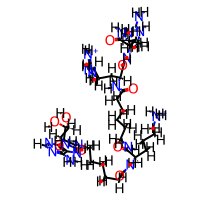

In [17]:
def load_and_process_sdf(sdf_file, dataset_name):
    # Load the SDF file
    df = PandasTools.LoadSDF(sdf_file, embedProps=False, removeHs=False, sanitize=False)
    
    # Add dataset name and rename columns
    df['Dataset'] = dataset_name
    df.rename(columns={'ROMol': '3D_Mol_H_ProtBoundConf', 'ID': 'Ligand_Instance'}, inplace=True)
    
    # Split 'Ligand_Instance' into multiple columns
    if dataset_name == 'CF': 
        df['PDB_ID'] = np.NAN
        df[['ID', 'Chain', 'Resi']] = df['Ligand_Instance'].str.split('_', expand=True)
        # Also add the prefix 'F' to the ID column
        df['ID'] = "F" + df["ID"].astype(str)
    elif dataset_name == 'PDB': 
        df[['PDB_ID', 'ID', 'Chain', 'Resi']] = df['Ligand_Instance'].str.split('_', expand=True)
    else: 
        df[['PDB_ID', 'ID', 'Chain', 'Resi']] = np.NAN
    
    # Calculate the number of non-hydrogen atoms resolved
    df['Num_Resolved_Atoms'] = df['3D_Mol_H_ProtBoundConf'].apply(lambda mol: mol.GetNumHeavyAtoms() if mol is not None else 0)

    # Calculate the number of hydrogen atoms
    df["Num_H_Atoms_ProtBoundConf"] = df["3D_Mol_H_ProtBoundConf"].apply(
    lambda mol: sum(1 for atom in mol.GetAtoms() if atom.GetAtomicNum() == 1) if mol else None)

    return df

# Load and process both datasets
CF_PROTOSS_df  = load_and_process_sdf(PROTOSS_sdffile_CF,  'CF')
PDB_PROTOSS_df = load_and_process_sdf(PROTOSS_sdffile_PDB, 'PDB')

# Concatenate the dataframes
PROTOSS_df = pd.concat([CF_PROTOSS_df, PDB_PROTOSS_df], ignore_index=True)

PROTOSS_df.tail(1)

#### Add Pocket Annotation

In [18]:
# Add Pocket Annotation
pockets_df = pd.read_csv(os.path.join('Analysis', 'Ligand_Copy_Pocket_Assignment.tsv'), sep="\t")
# Remove leading and trailing  spaces from the entire DataFrame
pockets_df = pockets_df.applymap(lambda x: x.strip() if isinstance(x, str) else x)
pockets_df.columns = pockets_df.columns.str.strip()
# Sort alphabetically
pockets_df = pockets_df.sort_values(by=['Dataset', 'Ligand_Instance'], ascending=[True, True])
print(len(pockets_df))
# pockets_df.tail(1)

369


/tmp/ipykernel_889377/667914.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pockets_df = pockets_df.applymap(lambda x: x.strip() if isinstance(x, str) else x)


Ligands {'5IZJ_6J9_G_1', '5J5X_6J9_B_1', '5IZJ_6J9_F_1', '6MM5_ANP_E_402', '4HPU_ANP_I_600', '6EM7_ADP_A_403'} are not considered.


,Ligand_Instance,3D_Mol_H_ProtBoundConf,Dataset,PDB_ID,ID,Chain,Resi,Num_Resolved_Atoms,Num_H_Atoms_ProtBoundConf,Pocket
0,001_B_1,,CF,None,F001,B,1,12,5,A

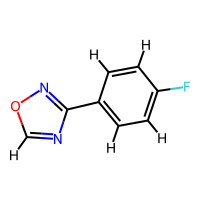

In [19]:
# Cross-Check which ligands from the pockets_df are missing in the PROTOSS_df and are thus not considered in the following.
print(f"Ligands {set(pockets_df['Ligand_Instance']) - set(PROTOSS_df['Ligand_Instance'])} are not considered.")

# Merge dataframes
PROTOSS_df = PROTOSS_df.merge(pockets_df, on=['Dataset', 'Ligand_Instance'], how="left")

# Some ligand instances have been assigned to multiple pockets. 
# Group by ligand instance! 
PROTOSS_df = PROTOSS_df.groupby(['Ligand_Instance'], as_index=False).agg({
            col: (lambda x: ', '.join(x.astype(str))) if col == 'Pocket' else 'first' 
            for col in PROTOSS_df.columns if col != 'Ligand_Instance'})

PROTOSS_df.head(1)

#### Filter for the 'proper' ligands only

In [20]:
# Proper Ligands
ligand_df = pd.concat([CF_df, PDB_df], ignore_index=True)

# Compute the number of non-hydrogen atoms
ligand_df['Num_Heavy_Atoms'] = ligand_df["SMILES"].apply(lambda smi: Chem.MolFromSmiles(smi).GetNumHeavyAtoms())

# Expected length = 36 Fragments + 239 PDB Crystal Structures = 275 
# print(len(ligand_df))

Dataset
PDB    281
CF      69
Name: count, dtype: int64
Ligands without pocket annotation = set()


,Ligand_Instance,3D_Mol_H_ProtBoundConf,Dataset,PDB_ID,ID,Chain,Resi,Num_Resolved_Atoms,Num_H_Atoms_ProtBoundConf,Pocket,SMILES,Name,Num_Heavy_Atoms
0,001_B_1,,CF,None,F001,B,1,12,5,A,O[C@H](C1)CN[C@@H]1c1nc(-c(cc2)ccc2F)n[o]1,"(3R,5S)‐5‐[3‐(4‐fluorophenyl)‐1,2,4‐oxadiazol‐5‐yl]pyrrolidin‐3‐ol",18

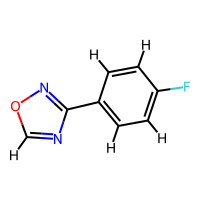

In [21]:
# Filtering is conducted by considering only rows from the PROTOSS_df that are also contained in the ligand_df
protboundligs_df = PROTOSS_df.merge(ligand_df, on=['Dataset', 'PDB_ID', 'ID'], how='inner')

# For the CF Dataset, we know that a total of 69 fragment copies bound
print(protboundligs_df['Dataset'].value_counts())

# Cross-Check which ligands from the PROTOSS_df   are missing in the pockets_df i.e. do not have a pocket annotation.
print(f"Ligands without pocket annotation = {set(protboundligs_df['Ligand_Instance']) - set(pockets_df['Ligand_Instance'])}")

protboundligs_df.head(1)

In [22]:
# Create Subdataframes! 
# String in Pocket column does (not) contain the substring 'A' as a word
ATP_site_ligs   = protboundligs_df[ protboundligs_df['Pocket'].str.contains(r'\bA\b', na=False)]
peripheral_ligs = protboundligs_df[~protboundligs_df['Pocket'].str.contains(r'\bA\b', na=False)]

ATP_site_ligs   = ATP_site_ligs[[  'Dataset', 'PDB_ID', 'ID']]
peripheral_ligs = peripheral_ligs[['Dataset', 'PDB_ID', 'ID']]

# Print number of unique ATP-Site/Peripheral Ligands 
print(len(ATP_site_ligs))
print(len(peripheral_ligs))

272
78


#### Check if the ligands are fully resolved

In [23]:
# Add a column Num_Not_Resolved_Atoms 
protboundligs_df['Num_Not_Resolved_Atoms'] = protboundligs_df['Num_Heavy_Atoms'] - protboundligs_df['Num_Resolved_Atoms']

In [24]:
# Filter for rows where not all atoms are resolved
incomplete_ligands_df = protboundligs_df[protboundligs_df['Num_Not_Resolved_Atoms'] != 0]

# Check for each row in the incomplete_ligands_df, if there is another row in the results_df 
# that has the same combination of values in the Dataset, the PDB_ID, and the ID columns

# Initialize a list to hold the results of the check
no_fullsized_ligand = []

# Iterate through each row in incomplete_ligands_df
for index, row in incomplete_ligands_df.iterrows():
    # Extract the values for Dataset, PDB_ID, and ID
    dataset_value = row['Dataset']
    pdb_id_value = row['PDB_ID']
    id_value = row['ID']
    
    # Check if there is a matching row in protboundligs_df for which the full-sized ligand has been resolved.
    match = protboundligs_df[
        (protboundligs_df['Dataset'] == dataset_value) &
        (protboundligs_df['ID'] == id_value) & 
        (protboundligs_df['Num_Not_Resolved_Atoms'] == 0)
    ].shape[0] > 0  
    
    # Append the result to the list
    no_fullsized_ligand.append({
        'Ligand_Instance':            row['Ligand_Instance'],
        'Dataset':                    row['Dataset'],
        'ID':                         row['ID'],
        'Full_Sized_Ligand_Anywhere': match, 
    })

# Convert the results to a DataFrame 
no_fullsized_ligand_df = pd.DataFrame(no_fullsized_ligand)

# Show only the ligands, for which no match was found 
no_fullsized_ligand_df = no_fullsized_ligand_df[no_fullsized_ligand_df['Full_Sized_Ligand_Anywhere'] == False].reset_index(drop=True)

no_fullsized_ligand_list = sorted(no_fullsized_ligand_df['ID'].unique())
print(f"For {len(no_fullsized_ligand_list)} ligands, no copy was fully resolved in any complex structure: {no_fullsized_ligand_list}")

no_fullsized_ligand_df.sort_values(by=['Dataset', 'ID'])

For 8 ligands, no copy was fully resolved in any complex structure: ['46P', '7W8', '9NT', 'AO8', 'BVZ', 'F009', 'F012', 'GGB']


,Ligand_Instance,Dataset,ID,Full_Sized_Ligand_Anywhere
0,009_B_1,CF,F009,False
1,009_B_2,CF,F009,False
2,012_B_1,CF,F012,False
4,5N3A_46P_A_404,PDB,46P,False
10,7PNS_7W8_A_402,PDB,7W8,False
3,5N1E_9NT_A_402,PDB,9NT,False
6,5OTG_AO8_A_401,PDB,AO8,False
7,5OUC_AO8_A_401,PDB,AO8,False
9,6I2H_AO8_A_401,PDB,AO8,False
8,6ERT_BVZ_A_401,PDB,BVZ,False


In [25]:
protbound_path = os.path.join('Analysis', os.path.join('Descriptors', 'Protein_Bound_Conformations'))

# Show the rows for the ligands in the no_fullsized_ligand_list
tmp_df = protboundligs_df[protboundligs_df['ID'].isin(no_fullsized_ligand_list)]
tmp_df.to_html(os.path.join(protbound_path, 'No_Fullsized_Ligand_Resolved.html'), index=False)
# tmp_df

#### Filter for (most) fully resolved ligands only

In [26]:
# Filter for fully resolved ligands only
CF_PDB_df = protboundligs_df[protboundligs_df['Num_Not_Resolved_Atoms'] == 0].reset_index(drop=True)

# For which ligands, there is no fully resolved copy was available in any complex structure?
ligs_before_filtering = list(set(ligand_df['ID'].to_list()))
ligs_after_filtering  = list(set(CF_PDB_df['ID'].to_list()))
diff = sorted([lig for lig in ligs_before_filtering if lig not in ligs_after_filtering])
print(f"For {len(diff)} ligands there is no fully resolved copy in any complex structure:\n{diff}. \n")

## For these cases, include the  most complete ligand copy/copies instead.
ligand_copies_to_keep = []
# Iterate over all ligands, for which no fully resolved copy is present in any complex structure
for incomplete_lig in diff: 
    # Extract the corresponding row from the dataframe
    rows = protboundligs_df[protboundligs_df['ID'] == incomplete_lig].reset_index(drop=True)
    # Identify the ligand copy/copies with the most atoms resolved
    max_resolved_atoms = rows['Num_Resolved_Atoms'].max()
    rows = rows[rows['Num_Resolved_Atoms'] == max_resolved_atoms]
    # Save the ligand copy identifier to list
    ligand_copies_to_keep.append(rows['Ligand_Instance'].to_list())
# Flatten the list
ligand_copies_to_keep = [item for sublist in ligand_copies_to_keep for item in sublist]

print(f"Instead, select the most fully resolved ligand copy/copies for these, being \n{ligand_copies_to_keep}")

CF_PDB_df = pd.concat([CF_PDB_df, protboundligs_df[protboundligs_df['Ligand_Instance'].isin(ligand_copies_to_keep)]]).reset_index(drop=True)

# Sort the dataframe 
CF_PDB_df = CF_PDB_df.sort_values(by=['Dataset', 'ID', 'PDB_ID'], ignore_index=True)

print("\nNumber of ligand copies per dataset after filtering")
print(CF_PDB_df['Dataset'].value_counts())

print("\nNumber of unique ligands per dataset after filtering")
print(CF_PDB_df.groupby(['Dataset', 'ID']).agg({'Ligand_Instance': list}).reset_index()['Dataset'].value_counts())

# Cross-Check
# print(df['Num_Not_Resolved_Atoms'].value_counts())

For 8 ligands there is no fully resolved copy in any complex structure:
['46P', '7W8', '9NT', 'AO8', 'BVZ', 'F009', 'F012', 'GGB']. 

Instead, select the most fully resolved ligand copy/copies for these, being 
['5N3A_46P_A_404', '7PNS_7W8_A_402', '5N1E_9NT_A_402', '5OTG_AO8_A_401', '5OUC_AO8_A_401', '6I2H_AO8_A_401', '6ERT_BVZ_A_401', '009_B_2', '012_B_1', '5N3K_GGB_A_401']

Number of ligand copies per dataset after filtering
Dataset
PDB    270
CF      57
Name: count, dtype: int64

Number of unique ligands per dataset after filtering
Dataset
PDB    160
CF      36
Name: count, dtype: int64


In [27]:
# Add Boolean Indicator: Does any copy of this ligand binds in the ATP-site?
CF_PDB_df['ATP_Site'] = CF_PDB_df.set_index(['Dataset', 'PDB_ID', 'ID']).index.isin(
    ATP_site_ligs.set_index(['Dataset', 'PDB_ID', 'ID']).index)

# Add Boolean Indicator: Does any copy of this ligand binds peripherically?
CF_PDB_df['Peripheral'] = CF_PDB_df.set_index(['Dataset', 'PDB_ID', 'ID']).index.isin(
    peripheral_ligs.set_index(['Dataset', 'PDB_ID', 'ID']).index)

# Print Number of ligands per Pocket Category 
for dataset in CF_PDB_df['Dataset'].unique(): 
    tmp_df = CF_PDB_df[CF_PDB_df['Dataset']==dataset]
    print(f"{dataset}") 
    print(f"Total number of ligand copies \t {len(tmp_df)}")
    tmp_df_ATP = tmp_df[tmp_df['ATP_Site']==True]
    print(f"ATP site ligand copies \t \t {len(tmp_df_ATP)}")
    tmp_df_peripheral = tmp_df[tmp_df['Peripheral']==True]
    print(f"Peripheral ligand copies \t {len(tmp_df_peripheral)}\n")

    print(f"Total number of unique ligands \t {len(tmp_df['ID'].unique())}")
    print(f"Unique ATP site ligands \t {len(tmp_df_ATP['ID'].unique())}")
    print(f"Unique Peripheral ligands \t {len(tmp_df_peripheral['ID'].unique())}\n\n")

CF
Total number of ligand copies 	 57
ATP site ligand copies 	 	 45
Peripheral ligand copies 	 48

Total number of unique ligands 	 36
Unique ATP site ligands 	 27
Unique Peripheral ligands 	 27


PDB
Total number of ligand copies 	 270
ATP site ligand copies 	 	 257
Peripheral ligand copies 	 50

Total number of unique ligands 	 160
Unique ATP site ligands 	 151
Unique Peripheral ligands 	 29




In [28]:
print("\nCF Fragments")
print("ATP-Site Binders")
print(CF_PDB_df[(CF_PDB_df['Dataset'] == 'CF') & (CF_PDB_df['ATP_Site'] == True) & (CF_PDB_df['Peripheral'] == False)]['ID'].unique())
print("Peripheral Binders")
print(CF_PDB_df[(CF_PDB_df['Dataset'] == 'CF') & (CF_PDB_df['ATP_Site'] == False) & (CF_PDB_df['Peripheral'] == True)]['ID'].unique())
print("Binding to both ATP and peripheral sites")
print(CF_PDB_df[(CF_PDB_df['Dataset'] == 'CF') & (CF_PDB_df['ATP_Site'] == True) & (CF_PDB_df['Peripheral'] == True)]['ID'].unique())

print("\nPDB Ligands")
print("ATP-Site Binders")
print(CF_PDB_df[(CF_PDB_df['Dataset'] == 'PDB') & (CF_PDB_df['ATP_Site'] == True) & (CF_PDB_df['Peripheral'] == False)]['ID'].unique())
print("Peripheral Binders")
print(CF_PDB_df[(CF_PDB_df['Dataset'] == 'PDB') & (CF_PDB_df['ATP_Site'] == False) & (CF_PDB_df['Peripheral'] == True)]['ID'].unique())
print("Binding to both ATP and peripheral sites")
print(CF_PDB_df[(CF_PDB_df['Dataset'] == 'PDB') & (CF_PDB_df['ATP_Site'] == True) & (CF_PDB_df['Peripheral'] == True)]['ID'].unique())

# Cross-Check: The False-False combination cannot exist! 
# print("\n", CF_PDB_df[(CF_PDB_df['ATP_Site'] == False) & (CF_PDB_df['Peripheral'] == False)]['ID'].unique())


CF Fragments
ATP-Site Binders
['F012' 'F024' 'F102' 'F184' 'F186' 'F203' 'F296' 'F310' 'F312']
Peripheral Binders
['F030' 'F058' 'F188' 'F189' 'F236' 'F283' 'F294' 'F313' 'F322']
Binding to both ATP and peripheral sites
['F001' 'F005' 'F009' 'F032' 'F055' 'F070' 'F073' 'F074' 'F134' 'F138'
 'F145' 'F168' 'F225' 'F248' 'F264' 'F274' 'F299' 'F304']

PDB Ligands
ATP-Site Binders
['0RW' '15I' '1LQ' '1SB' '1SQ' '2PY' '2SB' '35R' '3AE' '3SB' '46L' '46P'
 '47V' '495' '4L7' '4NB' '4PY' '4SB' '4W1' '504' '5H1' '6TV' '6TX' '6TY'
 '7CB' '7CT' '7K7' '7KB' '7QF' '7QI' '7QL' '7QR' '7QW' '7W8' '8BQ' '8ET'
 '8FZ' '8G2' '8GB' '8JW' '8LZ' '8M2' '8NE' '8PQ' '9CY' '9D1' '9K6' '9LQ'
 '9NT' 'A02' 'A03' 'ACP' 'ADE' 'ADP' 'AMP' 'ANP' 'AO8' 'ATP' 'B4Z' 'B99'
 'BJK' 'BJN' 'BVZ' 'E3Z' 'E5E' 'E9Q' 'EE4' 'EMU' 'F05' 'G96' 'G98' 'GAB'
 'GVG' 'GVN' 'GVQ' 'H52' 'HBD' 'I5G' 'I5S' 'IPH' 'IQB' 'IQP' 'IQU' 'ISQ'
 'J0G' 'J0P' 'J4B' 'L15' 'L20' 'L9L' 'L9M' 'L9N' 'LL1' 'LL2' 'LQ2' 'LR5'
 'LR8' 'LRT' 'M01' 'M02' 'M04' 'M05'

#### Extract SMILES (as crystallized)
With explicit Hydrogen Atoms

,Ligand_Instance,3D_Mol_H_ProtBoundConf,Dataset,PDB_ID,ID,Chain,Resi,Num_Resolved_Atoms,Num_H_Atoms_ProtBoundConf,Pocket,SMILES,Name,Num_Heavy_Atoms,Num_Not_Resolved_Atoms,ATP_Site,Peripheral,Standardized_SMILES,2D_Mol_H_ProtBound
0,001_B_2,,CF,None,F001,B,2,18,13,X,O[C@H](C1)CN[C@@H]1c1nc(-c(cc2)ccc2F)n[o]1,"(3R,5S)‐5‐[3‐(4‐fluorophenyl)‐1,2,4‐oxadiazol‐5‐yl]pyrrolidin‐3‐ol",18,0,True,True,[H]O[C@]1([H])C([H])([H])[C@@]([H])(C2=NC(C3=C([H])C([H])=C(F)C([H])=C3[H])=NO2)[N+]([H])([H])C1([H])[H],

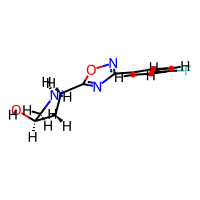
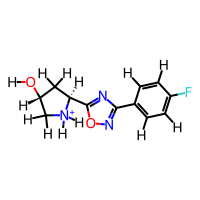

In [29]:
# Extract SMILES as crystallized, with explicit hydrogen atoms
CF_PDB_df['Standardized_SMILES'] = CF_PDB_df['3D_Mol_H_ProtBoundConf'].apply(
    lambda mol: Chem.MolToSmiles(mol) if mol is not None else None)

# Add 2D molecules with explicit hydrogen atoms
CF_PDB_df["2D_Mol_H_ProtBound"] = CF_PDB_df["Standardized_SMILES"].apply(
    lambda smi: Chem.AddHs(Chem.MolFromSmiles(smi)) if smi else None)

# tmp_df = CF_PDB_df[['ID', '2D_Mol', '2D_Mol_H_ProtBound', '3D_Mol_H_ProtBoundConf', 'SMILES', 'Standardized_SMILES' ]]

CF_PDB_df.head(1)

#### Same protonation state/tautomeric form for the same ligand across all instances?

In [30]:
# Check if the Standardized_SMILES are the same, for the same Dataset and ID values
differing_smiles = CF_PDB_df.groupby(['Dataset', 'ID'])['Standardized_SMILES'].nunique()
differing_smiles = differing_smiles[differing_smiles > 1]
print(f"Differing SMILES were found for the following pairs: \n{differing_smiles}")

# Extract and show the rows from CF_PDB_df, where SMILES differences occur across ligand instances
diff_smiles_rows = CF_PDB_df.merge(
    differing_smiles.reset_index()[['Dataset', 'ID']],
    on=['Dataset', 'ID'],
    how='inner')

# Add 2D Molecular Structure 
PandasTools.AddMoleculeColumnToFrame(diff_smiles_rows, smilesCol="Standardized_SMILES", molCol='2D_Mol_ProtBound')

# Keep only columns specified and sort
diff_smiles_rows = diff_smiles_rows[['Dataset', 'ID', 'Num_H_Atoms_ProtBoundConf', '2D_Mol_ProtBound', 
                                     'Standardized_SMILES', 'Num_Not_Resolved_Atoms', 'Name']]
diff_smiles_rows = diff_smiles_rows.sort_values(by=['Dataset', 'ID', 'Num_H_Atoms_ProtBoundConf']).reset_index(drop=True)

# Save to file
diff_smiles_rows.to_html(os.path.join(protbound_path, 'Differing_Protomers_Tautomers.html'))

Differing SMILES were found for the following pairs: 
Dataset  ID  
CF       F134    2
         F145    2
         F188    2
         F225    2
         F283    2
PDB      9LQ     2
         ADP     2
         ANP     3
         ATP     3
         BEZ     2
         T82     2
Name: Standardized_SMILES, dtype: int64


| Ligand | Reason for differing SMILES across crystallized instances | 
|------|------------------------------------------------------------------------------------|
| F134 | Differing protonation state of pyrrolidin   ring                                   |
| F145 | Different tautomeric form of central 2,4-substituted imidazole                     |
| F188 | Different stereochemistry at pyrrolidine-N, that became chiral upon   protonation. |
| F225 | Different tautomeric form of urea (Amin-Imin-Tautomerism)                          |
| F283 | Different stereochemistry at tertiary N, that became chiral upon   protonation.    |
| 9LQ  | Different stereochemistry at tertiary N, that became chiral upon   protonation.    |
| ADP  | Apparent different stereochemistry at phosphate-P (albeit not chiral)              | 
| ANP  | Apparent different stereochemistry at phosphate-P (albeit not chiral)              |
| ATP  | Apparent different stereochemistry at phosphate-P (albeit not chiral)              |
| BEZ  | Differing protonation state of carboxyl group                                      |
| T82  | Different tautomeric form                                                          |

#### Save protein-bound conformations to .sdf

In [31]:
def save_dataframe_to_sdf(dataset, filename, molColName, idName):
    """
    Helper function to save a DataFrame  as an SDF file.

    Parameters:
    dataset (DataFrame):  The DataFrame to be saved.
    filename (str):       The path and name of the SDF file.
    molColName (str):     The name of the molecule column.
    idName (str):         The column to serve as the molecule title.
    sdf_cols (list):      List of properties to export.
    """

    sdf_cols = [col for col in dataset.columns if col not in ['2D_Mol', '3D_Mol_H_ProtBoundConf', '2D_Mol_H_ProtBound']]

    PandasTools.WriteSDF(dataset,                    # Sub-Dataframe to be saved
                         filename,                   # Path and name of .sdf file
                         molColName=molColName,      # Name of the molecule column
                         idName=idName,              # Select a column to serve as molecule title
                         properties=sdf_cols,        # List of properties to export
                         allNumeric=False,           # Automatically include all numeric columns in the output
                         forceV3000=True             # Use the .sdf file V3000 format
                         )
    
save_dataframe_to_sdf(CF_PDB_df, 
                      filename   =  os.path.join(protbound_path, os.path.join('sdf_Files', 'Protein_Bound_Conformations_CF_PDB.sdf')), 
                      molColName =  '3D_Mol_H_ProtBoundConf', idName='ID')

In [32]:
# # WORKAROUND
# protbound_path = os.path.join('Analysis', os.path.join('Descriptors', 'Protein_Bound_Conformation'))

# CF_PDB_df = PandasTools.LoadSDF(os.path.join(protbound_path, os.path.join('sdf_Files', 'Protein_Bound_Conformations_CF_PDB.sdf')),  
#                          embedProps=False, removeHs=False, sanitize=False, molColName='3D_Mol_H_ProtBoundConf', idName='ID')

# # Convert specified columns to numeric 
# for col in ['Num_Resolved_Atoms', 'Num_H_Atoms_ProtBoundConf', 'Num_Heavy_Atoms', 'Num_Not_Resolved_Atoms']:
#     CF_PDB_df[col] = pd.to_numeric(CF_PDB_df[col], errors='coerce')

# CF_PDB_df = CF_PDB_df.drop(['2D_Mol_H_ProtBound'], axis=1)

# # Add 2D molecules with explicit hydrogen atoms
# CF_PDB_df["2D_Mol_H_ProtBound"] = CF_PDB_df["Standardized_SMILES"].apply(
#     lambda smi: Chem.AddHs(Chem.MolFromSmiles(smi)) if smi else None)

# CF_PDB_df.head(1)

## Apply molecular standardization for reference datasets, for which no crystal structures with PKA are in the PDB

In [33]:
# Adopted from https://www.blopig.com/blog/2022/05/molecular-standardization/

def standardize_mol(mol):
    """Standardize the RDKit molecule, select its parent molecule, uncharge it, then enumerate all the tautomers. 
    If verbose is true, an explanation of the steps and structures of the molecule as it is standardized will be output."""
    # Follows the steps from:
    # https://github.com/greglandrum/RSC_OpenScience_Standardization_202104/blob/main/MolStandardize%20pieces.ipynb
    # as described excellently by Greg Landrum in https://www.youtube.com/watch?v=eWTApNX8dJQ 
    
    from rdkit.Chem.MolStandardize import rdMolStandardize

    # Remove Hs, disconnect metal atoms, normalize the molecule (normalize functional groups), re-ionize the molecule
    clean_mol = rdMolStandardize.Cleanup(mol) 

    # If several fragments are present, get the "parent" molecule
    parent_clean_mol = rdMolStandardize.FragmentParent(clean_mol)

    # Try to neutralize the molecule
    # Note: No attempt is made at re-ionization at this step nor ionization at some pH (RDKit has no pKa caculator);
    # The main aim to to represent all molecules from different sources in a (single) standard way. 
    uncharged_parent_clean_mol = rdMolStandardize.Uncharger().uncharge(parent_clean_mol)
    # Update the property cache of the resulting molecule to ensure accurate property calculations
    uncharged_parent_clean_mol.UpdatePropertyCache(strict=False)
    # 
    #taut_uncharged_parent_clean_mol = rdMolStandardize.TautomerEnumerator().Canonicalize(uncharged_parent_clean_mol)
    #assert taut_uncharged_parent_clean_mol != None
    
    return uncharged_parent_clean_mol #taut_uncharged_parent_clean_mol


def standardize_smiles(smiles):
  """Standardize the SMILES string ..."""
  try: 
    std_mol = standardize_mol(Chem.MolFromSmiles(smiles))
    std_smiles = Chem.MolToSmiles(std_mol)
  except: 
     std_smiles = 'Standardization Failed' 
  return std_smiles

In [34]:
dataset_dfs = [ChEMBL_PKA_df, ChEMBL_Kinases_df, PKIs_df, OralDrugs_df]

for dataset_df in dataset_dfs: 
    # Apply molecular standardization. Run time approx. 45 sek
    dataset_df['Standardized_SMILES'] = dataset_df['SMILES'].apply(standardize_smiles)

[11:23:38] Initializing MetalDisconnector
[11:23:38] Running MetalDisconnector
[11:23:38] Initializing Normalizer
[11:23:38] Running Normalizer
[11:23:38] Initializing MetalDisconnector
[11:23:38] Running MetalDisconnector
[11:23:38] Initializing Normalizer
[11:23:38] Running Normalizer
[11:23:38] Running LargestFragmentChooser
[11:23:38] Running Uncharger
[11:23:38] Initializing MetalDisconnector
[11:23:38] Running MetalDisconnector
[11:23:38] Initializing Normalizer
[11:23:38] Running Normalizer
[11:23:38] Initializing MetalDisconnector
[11:23:38] Running MetalDisconnector
[11:23:38] Initializing Normalizer
[11:23:38] Running Normalizer
[11:23:38] Running LargestFragmentChooser
[11:23:38] Running Uncharger
[11:23:38] Initializing MetalDisconnector
[11:23:38] Running MetalDisconnector
[11:23:38] Initializing Normalizer
[11:23:38] Running Normalizer
[11:23:38] Initializing MetalDisconnector
[11:23:38] Running MetalDisconnector
[11:23:38] Initializing Normalizer
[11:23:38] Running Norma

# Drop duplicate molecules and combine datasets

In [35]:
# Create an empty dataframe to store the duplicate molecules
duplicates_df = pd.DataFrame()

for i, dataset_df in enumerate(dataset_dfs):
    print(f"\n {dataset_df['Dataset'].iloc[0]}")

    # Keep only Molecules, for which the Standardization did not fail
    failed_std = len(dataset_df)
    dataset_df = dataset_df[dataset_df['Standardized_SMILES'] != 'Standardization Failed']
    print(f"Standardization failed for {(failed_std - len(dataset_df))} molecules.")

    # Bring the 'Dataset' column to position one
    dataset_df = dataset_df[['Dataset'] + [col for col in dataset_df.columns if col != 'Dataset']]

    print(f"Number of Molecules before deduplication = {len(dataset_df)}")
    # Identify duplicate molecules based on the Standardized SMILES! 
    duplicates = dataset_df[dataset_df.duplicated(subset='Standardized_SMILES', keep=False)]
    # Append the duplicate rows to the duplicate_rows_df
    duplicates_df = pd.concat([duplicates_df, duplicates], ignore_index=True)
    # Drop duplicate molecules from each df, keep the first row!
    dataset_df = dataset_df.drop_duplicates(subset='Standardized_SMILES', ignore_index=True, keep='first')
    # Print the name of the dataset and the number of molecules contained after deduplication
    print(f"Number of Molecules after deduplication = {len(dataset_df)}")

    # CROSS-CHECK
    # Print, per Dataset, how often the most frequently occurring molecule is present. 
    # If deduplication worked as intended, this should be 1!
    print(f"Occurrence of most frequently occurring molecule = {dataset_df['ID'].value_counts().nlargest(1)}") #.iloc[0]}")

    # Add 2D Structure
    dataset_df["2D_Mol_H"] = dataset_df["Standardized_SMILES"].apply(lambda smi: Chem.AddHs(Chem.MolFromSmiles(smi)))

    # Replace the old DataFrame in the list with the updated one
    dataset_dfs[i] = dataset_df


 ChEMBL_PKA
Standardization failed for 0 molecules.
Number of Molecules before deduplication = 71
Number of Molecules after deduplication = 71
Occurrence of most frequently occurring molecule = ID
CHEMBL91829    1
Name: count, dtype: int64

 ChEMBL_Kinases
Standardization failed for 24 molecules.
Number of Molecules before deduplication = 38770
Number of Molecules after deduplication = 38721
Occurrence of most frequently occurring molecule = ID
CHEMBL3402492    1
Name: count, dtype: int64

 PKIs
Standardization failed for 0 molecules.
Number of Molecules before deduplication = 107
Number of Molecules after deduplication = 107
Occurrence of most frequently occurring molecule = ID
Fasudil    1
Name: count, dtype: int64

 OralDrugs
Standardization failed for 0 molecules.
Number of Molecules before deduplication = 1574
Number of Molecules after deduplication = 1064
Occurrence of most frequently occurring molecule = ID
CHEMBL4105630    1
Name: count, dtype: int64


In [36]:
# Molecules, that were removed upon standardization & deduplication
PandasTools.AddMoleculeColumnToFrame(duplicates_df, smilesCol='SMILES', molCol='Structure')
PandasTools.AddMoleculeColumnToFrame(duplicates_df, smilesCol='Standardized_SMILES', molCol='Standardized_Structure')
print(len(duplicates_df))
duplicates_df.to_html(os.path.join('Data', 'Duplicate_Molecules.html'))

1066


In [37]:
dataset_dfs = [CF_PDB_df] + dataset_dfs

# Concat dataframes together
df = pd.concat(dataset_dfs, axis=0, ignore_index=True)
df = df.reset_index(drop=True)

# Save to file

,Ligand_Instance,3D_Mol_H_ProtBoundConf,Dataset,PDB_ID,ID,Chain,Resi,Num_Resolved_Atoms,Num_H_Atoms_ProtBoundConf,Pocket,SMILES,Name,Num_Heavy_Atoms,Num_Not_Resolved_Atoms,ATP_Site,Peripheral,Standardized_SMILES,2D_Mol_H_ProtBound,2D_Mol_H
0,001_B_2,,CF,None,F001,B,2,18.0,13.0,X,O[C@H](C1)CN[C@@H]1c1nc(-c(cc2)ccc2F)n[o]1,"(3R,5S)‐5‐[3‐(4‐fluorophenyl)‐1,2,4‐oxadiazol‐5‐yl]pyrrolidin‐3‐ol",18.0,0.0,True,True,[H]O[C@]1([H])C([H])([H])[C@@]([H])(C2=NC(C3=C([H])C([H])=C(F)C([H])=C3[H])=NO2)[N+]([H])([H])C1([H])[H],,NaN
1,005_D_3,,CF,None,F005,D,3,17.0,12.0,A,O[C@H](C1)CN[C@@H]1c1nc(-c2nccnc2)n[o]1,"(3R,5S)‐5‐[3‐(pyrazin‐2‐yl)‐1,2,4‐oxadiazol‐5‐yl]pyrrolidin‐3‐ol",17.0,0.0,True,True,[H]O[C@]1([H])C([H])([H])[C@@]([H])(C2=NC(C3=NC([H])=C([H])N=C3[H])=NO2)[N+]([H])([H])C1([H])[H],,NaN

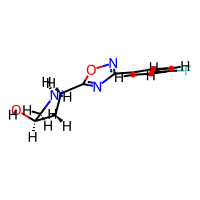
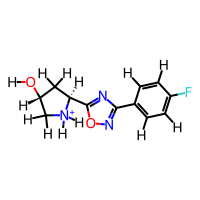
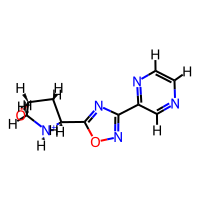
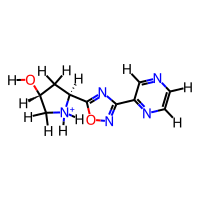

In [38]:
cols = ['Dataset', 'ID', 'Ligand_Instance', 'PDB_ID', 'Standardized_SMILES', 'SMILES', 'Name',
        'Pocket', 'ATP_Site', 'Peripheral', 'Num_H_Atoms_ProtBoundConf', 'Num_Resolved_Atoms', 'Num_Not_Resolved_Atoms']

df.to_excel(os.path.join('Data', '_Molecule_Data_Combined.xlsx'), index=False, header=True, columns=cols)
df.head(2)

,Ligand_Instance,3D_Mol_H_ProtBoundConf,Dataset,PDB_ID,ID,Chain,Resi,Num_Resolved_Atoms,Num_H_Atoms_ProtBoundConf,Pocket,SMILES,Name,Num_Heavy_Atoms,Num_Not_Resolved_Atoms,ATP_Site,Peripheral,Standardized_SMILES,2D_Mol_H_ProtBound,2D_Mol_H
40288,NaN,NaN,OralDrugs,NaN,CHEMBL750,NaN,NaN,NaN,NaN,NaN,NS(=O)(=O)Cc1noc2ccccc12,Zonisamide,NaN,NaN,NaN,NaN,NS(=O)(=O)Cc1noc2ccccc12,NaN,
40289,NaN,NaN,OralDrugs,NaN,CHEMBL4105630,NaN,NaN,NaN,NaN,NaN,C[C@@]1(O)CC[C@H]2[C@H](CC[C@@H]3[C@@H]2CC[C@]2(C)[C@@H](C(=O)Cn4cc(C#N)cn4)CC[C@@H]32)C1,Zuranolone,NaN,NaN,NaN,NaN,C[C@@]1(O)CC[C@H]2[C@H](CC[C@@H]3[C@@H]2CC[C@]2(C)[C@@H](C(=O)Cn4cc(C#N)cn4)CC[C@@H]32)C1,NaN,

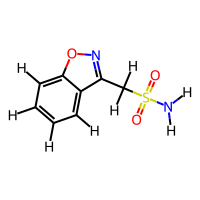
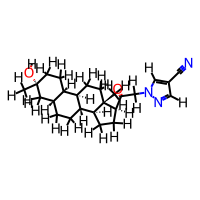

In [39]:
df.tail(2)

# Display Fragment Structures 

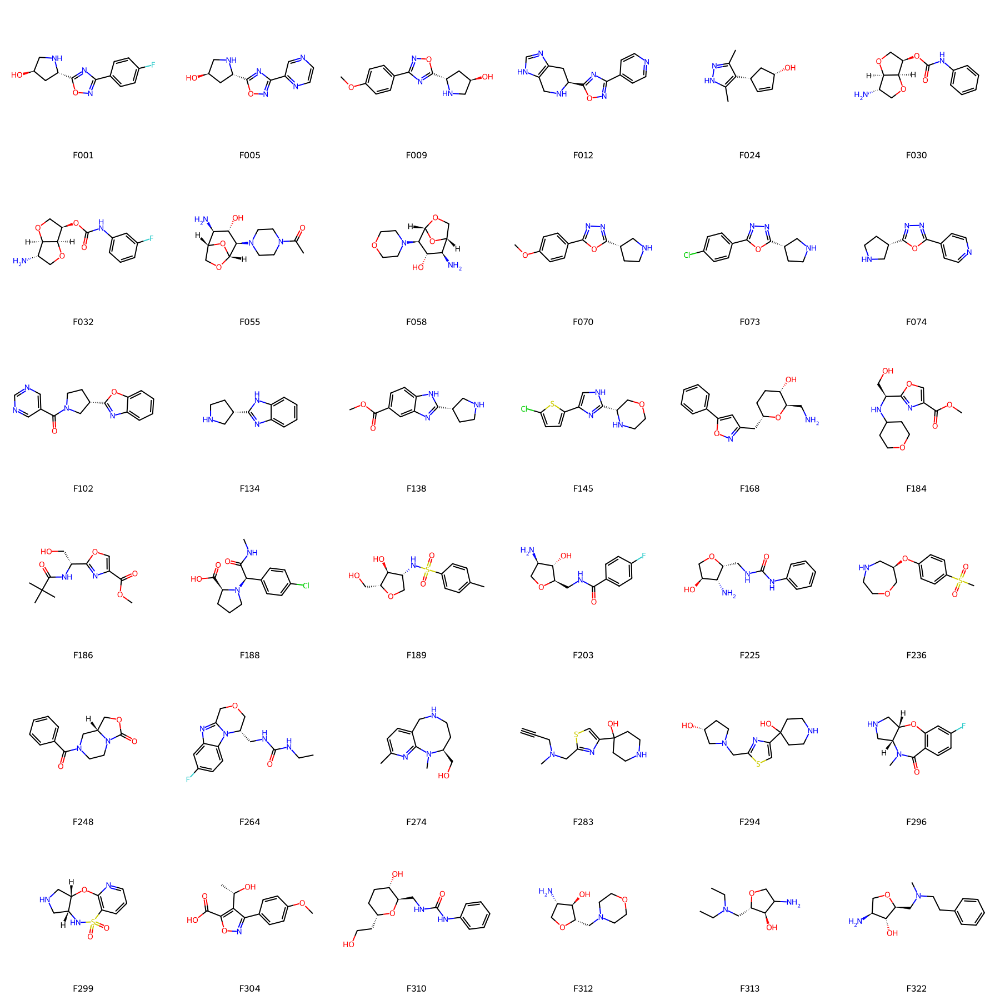

In [40]:
fragments_df = df[df['Dataset'] == 'CF']

# Drop duplicates, based on ID 
fragments_df = fragments_df.drop_duplicates(subset='ID')

# Number of molecules per row in the grid image
i = 6          

# Use the SMILES, as provided by AnalytiCon Discovery!
structures = Draw.MolsToGridImage([Chem.MolFromSmiles(x) for x in (fragments_df['SMILES'].to_list())],  
                                  legends = fragments_df['ID'].to_list(), 
                                  molsPerRow = i, subImgSize=(300, 300), 
                                  returnPNG=False)

structures_2D_path = os.path.join('Data', os.path.join('CrystalsFirst_Crystal_Structures'), os.path.join('2D_Structures_Fragments'))

structures.save(os.path.join(structures_2D_path, f'CF_Fragments_Structures_Overview_{i}.png'), dpi=(dpi, dpi))
structures

In [41]:
# Draw each fragment individually
for fragment in fragments_df['ID']:
    img = Draw.MolsToGridImage([Chem.MolFromSmiles(fragments_df[fragments_df['ID'] == fragment]['SMILES'].iloc[0])],
                            molsPerRow=1, 
                            subImgSize=(300, 300), 
                            legends=[fragment], 
                            returnPNG=False
                            )
    img.save(os.path.join(structures_2D_path, f'{fragment}.png'), dpi=(dpi, dpi))

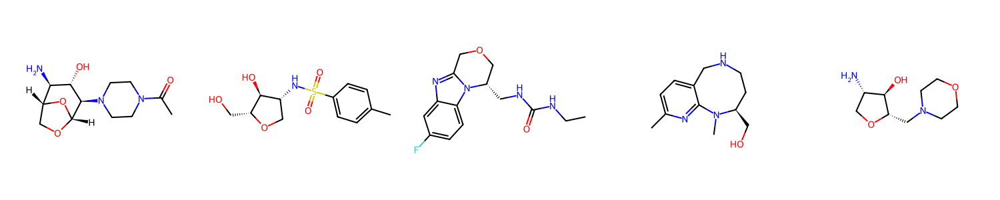

In [42]:
# Draw selected selected fragments

def draw_selected_fragments(selected_frgs, path=None, legends=False): 
    fragments_subdf = fragments_df[fragments_df['ID'].isin(selected_frgs)]
    legends = fragments_subdf['ID'].to_list() if legends else None
    structures = Draw.MolsToGridImage([Chem.MolFromSmiles(x) for x in (fragments_subdf['SMILES'].to_list())],  
                                    legends = legends, 
                                    molsPerRow = len(fragments_subdf), 
                                    subImgSize=(300, 300), 
                                    returnPNG=False)
    if path:
        structures.save(os.path.join(path, f"{'_'.join(selected_frgs)}.png"), dpi=(dpi, dpi))
    return structures

# For the graphical TOC
# structures_nolabel_path = os.path.join(structures_2D_path, os.path.join('nolabel'))
draw_selected_fragments(['F055', 'F189', 'F264', 'F274', 'F312'])

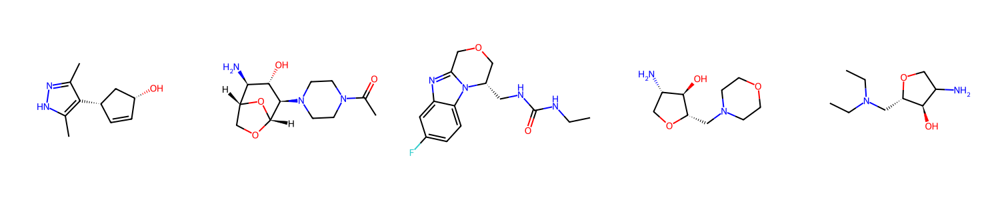

In [43]:
# For Descriptor Values Table
draw_selected_fragments(['F024', 'F055', 'F264', 'F312', 'F313'])

# Visualize molecule overlap between datasets
Venn Diagrams

In [44]:
def generate_venn(df, dataset1, dataset2, dataset3=None, params={}, color_map=None, filename=None):

    """
    Generate a venn diagram for two or three datasets stored within the same df. 

    Parameters:
    df        (pandas.DataFrame):  Input dataframe, with columns 'Dataset' and 'Standardized_SMILES'
    dataset1  (str):               Name of the first dataset.
    dataset2  (str):               Name of the second dataset.
    dataset3  (str,  optional):    Name of the third dataset. Defaults to None.
    params    (dict, optional):    Additional parameters for the Venn diagram. Defaults to {}.
    color_map (dict, optional):    Dictionary mapping dataset names to colors. Defaults to None.
    filename  (str,  optional):    File name to save the Venn diagram. Defaults to None.

    Returns:
    dict:     A dictionary containing the Venn diagram data.
    """
    
    # Create sub-dataframes for each dataset
    subdf1 = df[(df['Dataset'] == dataset1)]
    subdf2 = df[(df['Dataset'] == dataset2)]

    # Create sets of SMILES for each dataset
    set1 = set(subdf1['Standardized_SMILES'])
    set2 = set(subdf2['Standardized_SMILES']) 

    # If a third dataset name is provided, also create subdataframe and set of SMILES for this one
    if dataset3 is not None:
        subdf3 = df[(df['Dataset'] == dataset3)]
        set3 = set(subdf3['Standardized_SMILES'])

        # Calculate the Venn diagram data for three sets and store the data in a dictionary
        venn_data = {
            '100': set1 - set2 - set3,
            '010': set2 - set1 - set3,
            '001': set3 - set1 - set2,
            '110': set1 & set2 - set3,
            '101': set1 & set3 - set2,
            '011': set2 & set3 - set1,
            '111': set1 & set2 & set3
        }

        if params == {}: 
            params = {'set_labels': (dataset1, dataset2, dataset3), 'alpha': 0.55}

        if color_map:
            set_colors = [color_map[dataset1], color_map[dataset2], color_map[dataset3]]
        else: 
            set_colors = ['blue', 'red', 'green']
        
        # Create a Venn diagram for the three sets
        venn = venn3(subsets=(len(venn_data['100']), len(venn_data['010']), len(venn_data['110']), 
                              len(venn_data['001']), len(venn_data['101']), len(venn_data['011']), 
                              len(venn_data['111'])), **params, set_colors=set_colors)
    
    else:
        # Calculate the Venn diagram data for two sets and store the data in a dictionary
        venn_data = {
            '10': set1 - set2,
            '01': set2 - set1,
            '11': set1 & set2
        }

        if params == {}: 
            params = {'set_labels': (dataset1, dataset2), 'alpha': 0.55}
        
        if color_map:
            set_colors = [color_map[dataset1], color_map[dataset2]]
        else: 
            set_colors = ['blue', 'red']

        # Create a Venn diagram for two sets
        venn = venn2(subsets=(len(venn_data['10']), len(venn_data['01']), len(venn_data['11'])), **params, set_colors=set_colors)
    
    # Save and/or display the venn diagram
    if filename != None: 
        plt.savefig(filename)
    else:
        plt.show()

    return venn_data


# Mapping colors and datasets
color_map = {
    'CF':             'dodgerblue',
    'PDB':            'mediumseagreen',
    'ChEMBL_Kinases': 'lightcoral', 
    'ChEMBL_PKA':     'red',
    'PKIs':           'plum',
    'OralDrugs':      'gold', 
}

Note that the numbers in the Venn diagrams do not equal the number of unique ligands, <br>
as we may have multiple ligands present in alternativ protonation states / tautomeric forms, <br>
resulting in a differing SMILES representation (which is the basis for the Venn diagrams).

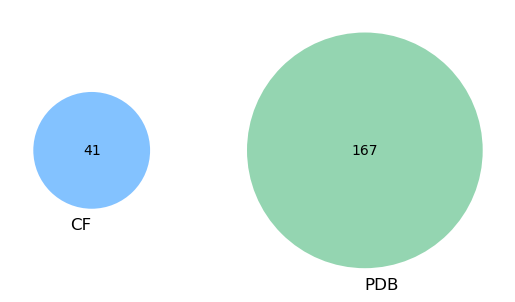

In [45]:
venn_data = generate_venn(df,
              dataset1='CF',  
              dataset2='PDB',
              dataset3=None, 
              color_map=color_map,
              # filename = os.path.join('Data', 'Venn_Fragments_PDB.png')
              )

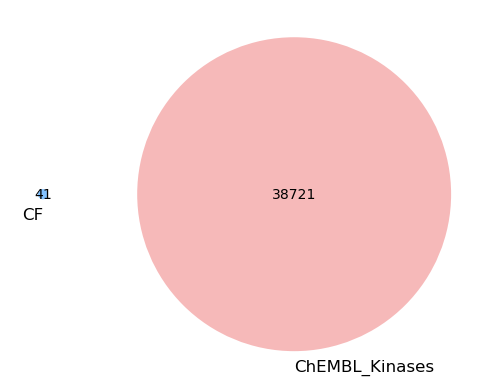

In [46]:
venn_data = generate_venn(df,
              dataset1='CF', 
              dataset2='ChEMBL_Kinases',
              dataset3=None, 
              color_map=color_map,
              # filename = os.path.join('Data', 'Venn_Fragments_ChEMBLKinases.png')
              )

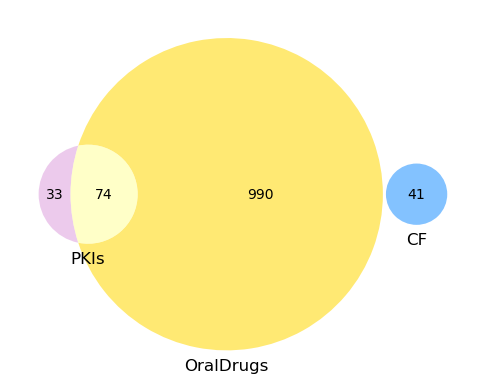

In [47]:
venn_data = generate_venn(df,
              dataset1='CF', 
              dataset2='PKIs', 
              dataset3='OralDrugs',
              color_map=color_map,
              # filename = os.path.join('Data', 'Venn_Fragments_OralDrugs_PKIs.png')
              )

# Check for pan-assay interference compounds (PAINS)


In [48]:
# Add the PAINS filter catalog to our FilterCatalogParams object, using the AddCatalog method. 
from rdkit.Chem.FilterCatalog import *
params = FilterCatalogParams()
params.AddCatalog(FilterCatalogParams.FilterCatalogs.PAINS)
catalog = FilterCatalog(params)

In [49]:
# Apply the filter to the data
# Iterate through each molecule and detects the presence of PAINs using the FilterCatalog object. 
# If PAINs are present, store relevant information in a list of dictionaries called matches

matches = []
clean = []
for index, row in tqdm(df.iterrows(), total=df.shape[0]):
    molecule = Chem.MolFromSmiles(row.Standardized_SMILES)
    entry = catalog.GetMatches(molecule) #Get all the matches/PAINs
    if entry:
        groups = []
        pains = []
        for i in entry:
            pains.append(i.GetDescription().capitalize())
            groups.append(i.GetProp('Scope'))
        matches.append({
            "Dataset" :    row.Dataset, 
            "ID":          row.ID,
            "SMILES":      row.Standardized_SMILES,
            "PAINS":       pains,
            "PAINS_Group": groups
            })
    else:
        # Collect indices of molecules without PAINS
        clean.append(index)

# Filter the molecules for PAIN-free structures only
PAINSfree_df = df.loc[clean]

# Show the PAINS 
PAINS_df = pd.DataFrame(matches)
if len(PAINS_df) == 0: 
    print("No PAINS identified.")
else: 
    print(f"\n {len(PAINS_df)} PAINS identified")
    print(PAINS_df['Dataset'].value_counts())
PandasTools.AddMoleculeColumnToFrame(PAINS_df, smilesCol="SMILES", molCol='Mol')
PandasTools.RenderImagesInAllDataFrames(images=True)

100%|██████████| 40290/40290 [00:48<00:00, 830.65it/s] 



 1817 PAINS identified
Dataset
ChEMBL_Kinases    1748
OralDrugs           56
PDB                  8
PKIs                 4
ChEMBL_PKA           1
Name: count, dtype: int64
